# Functions

In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import optuna
import torch
from neuralforecast.auto import NHITS
from neuralforecast.core import NeuralForecast
from neuralforecast.losses.pytorch import MSE
import logging
from sklearn.metrics import mean_absolute_error, mean_squared_error
from feature_engine.datetime import DatetimeFeatures
from feature_engine.creation import CyclicalFeatures
from feature_engine.timeseries.forecasting import ExpandingWindowFeatures,LagFeatures
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sktime.transformations.series.fourier import FourierFeatures
from feature_engine.timeseries.forecasting import WindowFeatures
import holidays
from sklearn.ensemble import RandomForestRegressor
from optuna.samplers import TPESampler
from optuna.pruners import HyperbandPruner
import csv
from neuralforecast.models import KAN
from sklearn.svm import SVR
from sklearn.linear_model import SGDRegressor


c:\Users\gkeep\anaconda3\envs\Trafo\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-07-16 09:53:10,980	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2025-07-16 09:53:12,807	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


In [2]:

def plot_errors(ErrorSeries):
    """
    Plots the Mean Squared Error (MSE) values against features to visualize feature selection performance.

    Args:
        ErrorSeries (pd.Series): A pandas Series where indices are feature names
                                 and values are corresponding errors (e.g., MSE).
    """
    import matplotlib.pyplot as plt
    import numpy as np

    # Prepare the data
    x = np.arange(len(ErrorSeries))  # Numerical x-axis indices
    y = ErrorSeries.values           # Error values
    labels = ErrorSeries.index       # Feature names

    # Initialize the plot
    plt.figure(figsize=(14, 6))
    plt.style.use("seaborn-v0_8-whitegrid")  # Use clean seaborn grid style

    # Plot the error series
    plt.plot(x, y, marker='o', linestyle='-', color='b', linewidth=2)

    # Customize x-ticks and labels
    plt.xticks(x, labels, rotation=45, ha="right")
    plt.ylabel("MSE (Mean Squared Error)", wrap=True)
    plt.xlabel("Features", wrap=True)
    plt.title("Feature Selection Performance: MSE vs Features", fontsize=14, pad=15)

    # Adjust margins and spacing
    plt.tight_layout()
    plt.show()

In [3]:

# Feature selection using SHAP-ordered features and TS Cross-Validation
def FeatureSelection_fixed_test(regressor, DF_features, DF_target, ordered_features_list, test_size=672, tolerance=50):
    feature_list = []
    error_list = []
    total_samples = len(DF_features)
    n_splits = 5
    no_improvement_count = 0
    min_error = float('inf')

    for i in ordered_features_list:
        feature_list.append(i)
        X = DF_features[feature_list].to_numpy()
        y = DF_target.to_numpy()

        # Custom TS CV logic
        splits = []
        start_train_size = total_samples - (n_splits * test_size)
        for split in range(n_splits):
            train_end = start_train_size + split * test_size
            test_start = train_end
            test_end = test_start + test_size
            if test_end <= total_samples:
                splits.append((list(range(0, train_end)), list(range(test_start, test_end))))

        # Perform cross-validation
        TimeSeriesCVerror = []
        for train_index, test_index in splits:
            X_train, X_test = X[train_index], X[test_index]
            y_train, y_test = y[train_index], y[test_index]
            regressor.fit(X_train, y_train)
            predicted_val = regressor.predict(X_test)
            Error = mean_squared_error(y_test, predicted_val)
            TimeSeriesCVerror.append(Error)

        # Average error across splits
        TS_CV_error = sum(TimeSeriesCVerror) / len(TimeSeriesCVerror)
        error_list.append(TS_CV_error)

        # Track improvement
        if TS_CV_error < min_error:
            min_error = TS_CV_error
            no_improvement_count = 0
        else:
            no_improvement_count += 1

        if no_improvement_count >= tolerance:
            print(f"No improvement after {tolerance} features. Stopping early.")
            break

    ErrorSeries = pd.Series(error_list, index=feature_list)
# Plot the errors using a custom plot function
    plot_errors(ErrorSeries)


    return ErrorSeries

def keep_indices_till_min(series):
    selected_features = []
    min_value = series.min()
    for idx, value in series.items():
        if idx not in selected_features:
            selected_features.append(idx)
        if value == min_value:
            break
    return selected_features


In [4]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

def peak_RMSE(y_true: np.ndarray, y_pred: np.ndarray, threshold: float = 1.2) -> float:
    """
    Calculate RMSE for values where the true values exceed a certain threshold.

    Args:
        y_true (np.ndarray): Array of true target values.
        y_pred (np.ndarray): Array of predicted target values.
        threshold (float): Threshold for filtering peak values (default is 5000).

    Returns:
        float: RMSE for the filtered values.
    """
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    filtered_indices = y_true > threshold

    # Filter both predictions and true values based on the threshold
    filtered_predictions = y_pred[filtered_indices]
    filtered_real_values = y_true[filtered_indices]

    # Avoid division by zero or empty slices
    if len(filtered_real_values) == 0:
        return 0.0

    # Calculate RMSE for the filtered data
    rmse = np.sqrt(mean_squared_error(filtered_real_values, filtered_predictions))
    return rmse

def ErrorCalculator(name: str, y_true: np.ndarray, y_pred: np.ndarray, threshold: float = 1.2) -> dict:
    """
    Calculate multiple error metrics for predictions.

    Args:
        name (str): Name of the pipeline or model.
        y_true (np.ndarray): Array of true target values.
        y_pred (np.ndarray): Array of predicted target values.
        threshold (float): Threshold for peak RMSE calculation (default is 5000).

    Returns:
        dict: A dictionary containing RMSE, MAE, MSE, and PRMSE.
    """
    errors = {
        "Pipelines": name,
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "MAE": mean_absolute_error(y_true, y_pred),
        "MSE": mean_squared_error(y_true, y_pred),
        "PRMSE": peak_RMSE(y_true, y_pred, threshold),
    }
    return errors

In [5]:


def CreateWorkHourFeature(input_data):
    """
    Receives as input a DataFrame or Series and outputs a DataFrame with the working hours during the day.
    When the day of the week is larger than 4, it is considered a weekend (1), otherwise, it's a workday (0).
    During workdays and between 8:00 and 17:00, it is considered a working hour.

    Parameters:
    input_data (DataFrame or Series): Input data with a DatetimeIndex.

    Returns:
    DataFrame: DataFrame with the added "WorkingHour_flag" column.
    """
    if isinstance(input_data, pd.Series):
        input_df = pd.DataFrame(input_data)
    elif isinstance(input_data, pd.DataFrame):
        input_df = input_data
    else:
        raise ValueError("Input must be a DataFrame or Series.")

    assert isinstance(input_df.index, pd.DatetimeIndex), "Index must be a datetime index."

    input_df["dayOfWeek"] = input_df.index.dayofweek
    input_df.loc[input_df["dayOfWeek"] > 4, "weekendFlag"] = 1
    input_df.loc[input_df["dayOfWeek"] < 5, "weekendFlag"] = 0
    input_df["hour"] = input_df.index.hour
    input_df["WorkingHour_flag"] = 0
    input_df.loc[((input_df["hour"] > 8) & (input_df["hour"] < 17) & (input_df["weekendFlag"] == 0)), "WorkingHour_flag"] = 1
    input_df.drop(["hour", "dayOfWeek", "weekendFlag"], axis=1, inplace=True)

    return input_df


def ListCreatorFlagger(df, substrings=['flag', 'cos', 'sin','day_of_week', 'day_of_month', 'weekend', 'days_in_month', 'hour', 'minute']):
    """
    A function that separates the columns containing specified substrings from those that don't.
    df is the dataframe in question and the substring is a list.
    """
    flag_columns = [col for col in df.columns if any(substring in col for substring in substrings)]

    if not flag_columns:
        print("No columns with the specified substrings found.")
        return None, None

    non_flag_columns = [col for col in df.columns if col not in flag_columns]

    return non_flag_columns, flag_columns

def HolidayFeatureCreator(input_data):
    """
    Receives as input a DataFrame or Series and creates a column named "Holidays_flag" with 1 if there is a holiday and with 0 if no holidays exist.
    Holidays derived from Germany.
    """
    if isinstance(input_data, pd.Series):
        input_df = pd.DataFrame(input_data)
    elif isinstance(input_data, pd.DataFrame):
        input_df = input_data
    else:
        raise ValueError("Input must be a DataFrame or Series.")

    assert isinstance(input_df.index, pd.DatetimeIndex), "Index must be a datetime index."

    national_holidays_all = holidays.DE(years=[2011,2012,2013,2014,2015,2016,2017,2018,2019,2020, 2021, 2022, 2023, 2024, 2025, 2026]).items()
    national_holidays = [items[0] for items in national_holidays_all]  # this is a list

    # Create a new column for holidays flag
    input_df["Holidays_flag"] = 0

    # Iterate over the index and set holiday flag to 1 if the date matches any national holiday
    for index_date in input_df.index:
        if index_date.date() in national_holidays:
            input_df.at[index_date, "Holidays_flag"] = 1

    return input_df




def TimeRelatedFeatureConstructor(df):
  """
  Works only in a dataframe as input: run the other functions first.
  Extracts time-related features
  """
  TimeFeaturesToExtract=["day_of_week","weekend","hour","minute",] #consider to add more
  dtfs=DatetimeFeatures(variables="index", features_to_extract=TimeFeaturesToExtract, drop_original=False)
  df=dtfs.fit_transform(df)

  CyclicalFeaturesToExtract=["day_of_week","hour","minute",]
  cyclical_dtfs=CyclicalFeatures(variables=CyclicalFeaturesToExtract,drop_original=False)
  df=cyclical_dtfs.fit_transform(df)
  return df


def FourierFeatureConstructor(df,granularity,fourier_terms_list):

    number_part = ''.join(filter(str.isdigit, granularity))
    number_int = int(number_part)
    minutes4hour = 60 / number_int  # Ensure minutes4hour is at least 2
    #minutes4hour = max(2, 60 / number_int)  # Ensure minutes4hour is at least 2

    Fourier_Transformer=FourierFeatures(
        sp_list=[minutes4hour, 24*minutes4hour,24*7*minutes4hour,24*30*minutes4hour],   # hourly, 24 is daily seasonality *12 because for 60 min we have 12 intervals,  and 24*7 is weekly seasonality
        fourier_terms_list=fourier_terms_list,
        freq=granularity, #not necessery
        keep_original_columns=True,

    )

    Fourier_Transformer.fit(df)
    df=Fourier_Transformer.transform(df)
    return df

def WindowFeaturesConstructor(df, granularity, ListWithNoFlags):
    """
    This is a function that makes a list of 4 window features starting from double the granularity and following by doubling the previous value
    """
    number_part = ''.join(filter(str.isdigit, granularity))
    number_int = int(number_part)
    double_granularity = 2 * number_int
    time_intervals = [double_granularity]

    # Calculate subsequent values
    for i in range(3):
        time_intervals.append(time_intervals[-1] * 2)

    windowlist = [interval // number_int for interval in time_intervals]  # Corrected division
    functionsList = ["mean", "std"]
    WindownFeatureTransformer = WindowFeatures(variables=ListWithNoFlags,
                                               functions=functionsList,
                                               window=windowlist,
                                               freq=granularity,
                                               drop_original=False)

    df = WindownFeatureTransformer.fit_transform(df)
    return df

def ExpandingWindowFeatureConstructor(df,ListWithNoFlags):
  functionsList=["mean","std"]
  frequency = pd.infer_freq(df.index) #infer the frequency from the dataframe
  ExpandingWindownFeatureTransformer=ExpandingWindowFeatures(variables=ListWithNoFlags,
                                                           functions=functionsList,
                                                           freq=frequency, #I put the freq to shift it down! but now it is performed automatically!
                                                           drop_original=False)
  df=ExpandingWindownFeatureTransformer.fit_transform(df)
  return df

def WeightedLinearFeatureMaker(df,ListWithNoFlags,granularity):
  """
  This is a function that takes the original DF and modifies the continious value columns
  Inputs: Dataframe, List of columns that are continous values, daily window to slide, weights of the values
  """
  number_part = ''.join(filter(str.isdigit, granularity))
  Minutedensity=int(number_part)
  Window=int((60/Minutedensity)*24) #288 means a daily window
  weights=np.arange(1,Window+1)

  # if i had hourly data then i would have had np.arange(1,24*7) for a weekly window

  def weighted_mean (x,weights):
    return (weights*x).sum()/weights.sum()

  def weighted_std(x,weights):
    mean_w= weighted_mean(x, weights)
    var_w= (weights* (x-mean_w)**2).sum()/weights.sum()
    return np.sqrt(var_w)

  # LETS make the weighted mean column
  for i in ListWithNoFlags:
    result=(
        df[i]
        .rolling(window=Window) #here we pick a window size. Needs to be the same as the len(weights)
        .apply(weighted_mean, args=(weights,))
        .shift(1)#shift by 1 to avoid data leakage
        .to_frame()#convert series to df
        )

    result.columns=[str(i)+"_weighted_"+str(Window)+"_mean"]
    df=df.join(result)

  for i in ListWithNoFlags:
    result=(
        df[i]
        .rolling(window=Window) #here we pick a window size. Needs to be the same as the len(weights)
        .apply(weighted_std, args=(weights,))
        .shift(1)#shift by 1 to avoid data leakage
        .to_frame()#convert series to df
        )

    result.columns=[str(i)+"_weighted_"+str(Window)+"_std"]
    df=df.join(result)
  return df

def ExpWeightMeanMaker(df,ListWithNoFlags,granularity):
  """
  This is a function that makes exp weighted average with a sliding window approach
  """
  number_part = ''.join(filter(str.isdigit, granularity))
  Minutedensity=int(number_part)
  Window=int((60/Minutedensity)*24) #288 means a daily window

  def exp_weights(alpha,window_size):
    """
    a function to calculate the weights for every single component of our sliding windown
    """
    weights=np.ones(window_size) #initializing weights
    for ix in range(window_size):
      weights[ix]=(1-alpha)**(window_size-1-ix)
    return weights

  def exp_weighted_mean(x):
    """
    a functions that calculates the exp weigted mean
    """

    weights=exp_weights(alpha=0.05, window_size=len(x)) # HERE WE SET THE ALPHA
    return (weights*x).sum()/weights.sum()

  for i in ListWithNoFlags:
    result=(
        df[i]
        .rolling(window=int(Window))
        .agg([exp_weighted_mean])
        .shift(1)
    )


    result.columns=[str(i)+"_Exp_weighted_"+str(Window)+"_SL.win"]
    df=df.join(result)
  return df

def WeightedExponentialExpandingWindow(df,ListWithNoFlags,alpha):
  """
  This is a funtion that takes as input the df,a list of continuous values and the alpha.
  Outputs: all continuous features on the df that are "mean" and "std"
  """

  for i in ListWithNoFlags:
    df[[str(i)+"_ewm_mean_expanding.win",str(i)+"ewm_std_expanding.win"]]= (
                                              df[i].ewm(alpha=alpha).
                                              agg(["mean","std"])
                                              .shift(1)
                                            )
  return df

def FeatureLagger(df,ListOfFeatures,granularity,PredictionHorizon):

    time_intervals = []
    number_part = ''.join(filter(str.isdigit, granularity))
    Minutedensity=int(number_part)
    end_in_day=int((PredictionHorizon)/(Minutedensity))
    for i in range(1, 1+end_in_day):  # 24 hours * 60 minutes / 15 minutes = 96 intervals
        time_intervals.append(f"{i * 15}min")

    lag_transformer= LagFeatures(variables=ListOfFeatures,
                                freq=time_intervals,
                                drop_original=False) #make a lagger transformer drop all original features

    df=lag_transformer.fit_transform(df) # transform the features to DF joined
    return df

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import numpy as np
import holidays
import re
from sklearn.preprocessing import MinMaxScaler
from feature_engine.timeseries.forecasting import (
    WindowFeatures,
    ExpandingWindowFeatures,
    LagFeatures
)
import pandas as pd
from feature_engine.datetime import DatetimeFeatures
from feature_engine.creation import CyclicalFeatures
from sktime.transformations.series.fourier import FourierFeatures

In [7]:
def separate_future_past_features(df_columns):
    """
    Separates future and past features from a list of dataframe columns.

    Args:
        df_columns (list): A list of column names from the dataframe.

    Returns:
        dict: A dictionary with keys 'future_features' and 'past_features', containing the respective lists of column names.
    """
    future_keywords = ['sin', 'cos', 'weekend', 'hour', 'holiday', 'minute', 'day','+']

    future_features = []
    past_features = []

    for col in df_columns:
        # Check if the column contains "+" in its name to classify as a past feature
        if any(keyword in col.lower() for keyword in future_keywords):
            future_features.append(col)
        # Columns that don't meet the above conditions are considered past features by default
        else:
            past_features.append(col)

    return future_features, past_features

In [8]:

def plot_predictions(model_name, df_validation_y, all_preds_unscaled):
    plt.figure(figsize=(14, 7))

    # Plot actual values
    plt.plot(df_validation_y.index, df_validation_y.values, label='Actual Values', color='blue', linewidth=1)

    # Plot predicted values
    plt.plot(all_preds_unscaled.index, all_preds_unscaled.values, label=f'Predicted Values ({model_name})', color='red', linestyle='-', linewidth=1)

    # Add labels and title
    plt.xlabel('Time')
    plt.ylabel('Power (kW)')
    plt.title(f'Actual vs Predicted Values ({model_name})')

    # Add legend
    plt.legend()

    # Rotate x-ticks for better readability
    plt.xticks(rotation=45)

    # Show the plot
    plt.tight_layout()
    plt.show()



In [9]:
def FeatureLagger(df, ListOfFeatures, granularity, PredictionHorizon):
    Minutedensity = int(''.join(filter(str.isdigit, granularity)))  # Extract 30 from "30min"
    end_in_day = PredictionHorizon // Minutedensity
    time_intervals = [f"{i * Minutedensity}min" for i in range(1, end_in_day + 1)]

    lag_transformer = LagFeatures(
        variables=ListOfFeatures,
        freq=time_intervals,
        drop_original=False
    )
    df = lag_transformer.fit_transform(df)
    return df

def WindowFeaturesConstructor(df, granularity, ListWithNoFlags):
    Minutedensity = int(''.join(filter(str.isdigit, granularity)))
    double_granularity = 2 * Minutedensity
    time_intervals = [double_granularity]

    for i in range(3):
        time_intervals.append(time_intervals[-1] * 2)

    windowlist = [interval // Minutedensity for interval in time_intervals]
    WindownFeatureTransformer = WindowFeatures(
        variables=ListWithNoFlags,
        functions=["mean", "std"],
        window=windowlist,
        freq=granularity,
        drop_original=False
    )
    df = WindownFeatureTransformer.fit_transform(df)
    return df


In [10]:
def peak_RMSE(y_true, y_pred, threshold=2.7):

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    filtered_indices = y_true > threshold

    # Filter both predictions and true values based on these indices
    filtered_predictions = y_pred[filtered_indices]
    filtered_real_values = y_true[filtered_indices]

    # Calculate the Mean Squared Error (MSE) for the filtered data
    rmse = np.sqrt(mean_squared_error(filtered_real_values, filtered_predictions))
    return rmse
def ErrorCalculator(name, y_true, y_pred):

    errors = {"Pipelines": name,
              "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
              "MAE": mean_absolute_error(y_true, y_pred),
              "MSE": mean_squared_error(y_true, y_pred),
              "PRMSE":peak_RMSE(y_true, y_pred),
             }
    return errors

In [11]:
def plot_errors (ErrorSeries):
  """
  This is a function that plots the features that are not
  """
  import matplotlib as mpl
  import matplotlib.pyplot as plt
  import matplotlib.path as mpath
  import numpy as np

  import matplotlib.pyplot as plt
  import numpy as np

  x = np.arange(len(ErrorSeries.index))
  y = ErrorSeries.values
  labels = ErrorSeries.index

  plt.figure(1,figsize=(13,5))
  plt.style.use("seaborn-v0_8-whitegrid")
  plt.plot(x, y)

  plt.xticks(x, labels, rotation =40)
  plt.ylabel('MSE [W^2]', wrap=True)
  plt.xlabel('Features', wrap=True)


  plt.margins(0.05)

  plt.subplots_adjust(bottom = 0.05)
  plt.show()


def FeatureSelectionWithSHAP1_fixed_test(regressor, DF_features, DF_target, ordered_features_list, test_size=672, tolerance=50):
    """
    This function receives a regressor model, the features that the model was trained with,
    and the target that it had to forecast. Starting from the most important feature,
    we find the error of the TimeSeries Cross-Validation with a fixed test size.
    By adding features, we find the new error of the forecast.

    Parameters:
    - regressor: The regression model to use for training and prediction.
    - DF_features: DataFrame containing the features.
    - DF_target: Series containing the target variable.
    - ordered_features_list: List of features ordered by importance (e.g., from SHAP analysis).
    - test_size: Number of steps to use in the test set (default is 672).
    - tolerance: Number of features to add before stopping if no improvement in error (default is 20).

    Returns:
    - ErrorSeries: A pandas Series with the errors for each step of feature addition.
    """

    feature_list = []  # Empty list of features
    error_list = []  # Empty list to store errors for each set of features
    total_samples = len(DF_features)  # Total number of samples in the dataset
    n_splits = 5  # Number of splits (fixed)
    no_improvement_count = 0  # Count features added without improvement
    min_error = float('inf')  # Start with a large error to track the minimum error

    for i in ordered_features_list:
        # Start the loop with the best feature and append the next ones
        feature_list.append(i)

        X = DF_features[feature_list].to_numpy()
        y = DF_target.to_numpy()

        #print(f"Performing feature selection with features: {feature_list}")

        # Custom logic to create splits with a fixed test size of 672
        splits = []
        start_train_size = total_samples - (n_splits * test_size)  # Calculate where to start training

        for split in range(n_splits):
            train_end = start_train_size + split * test_size
            test_start = train_end
            test_end = test_start + test_size

            if test_end <= total_samples:  # Ensure the test set is within the bounds
                splits.append((list(range(0, train_end)), list(range(test_start, test_end))))

        TimeSeriesCVerror = []  # MSE errors for each fold

        # Time series cross-validation with fixed test size
        for train_index, test_index in splits:
            #print(f"TRAIN: {train_index}, TEST: {test_index}")
            X_train, X_test = X[train_index], X[test_index]
            y_train, y_test = y[train_index], y[test_index]

            # Train the regressor and predict
            regressor.fit(X_train, y_train)
            predicted_val = regressor.predict(X_test)

            # Calculate the error for this fold
            Error = mean_squared_error(y_test, predicted_val)
            TimeSeriesCVerror.append(Error)
            #print(f"This is the error for one TS iteration: {Error}")

        # Calculate the average error across all splits
        TS_CV_error = sum(TimeSeriesCVerror) / len(TimeSeriesCVerror)
        #print(f"Cumulative error of the last steps: {TS_CV_error}")
        error_list.append(TS_CV_error)  # Store the error for this set of features

        # Check if the error improved
        if TS_CV_error < min_error:
            min_error = TS_CV_error  # Update the minimum error
            no_improvement_count = 0  # Reset the no-improvement count
        else:
            no_improvement_count += 1  # Increment if there's no improvement

        # Break the loop if no improvement is observed after 20 features
        if no_improvement_count >= tolerance:
            print(f"No improvement after {tolerance} features. Stopping early.")
            break

    # Create a pandas Series to store the error associated with each feature
    ErrorSeries = pd.Series(error_list, index=feature_list)

    # Plot the errors using a custom plot function
    plot_errors(ErrorSeries)

    return ErrorSeries

In [12]:
def keep_indices_till_min(series):
    """
    Keeps all index values from the series up to and including the minimum value using a for loop,
    while ensuring no duplicates are added.

    Parameters:
    - series: A pandas Series where the index are feature names and the values are errors.

    Returns:
    - A list of unique index values (features) up to and including the minimum error value.
    """
    # Initialize an empty list to store the selected indices
    selected_features = []

    # Find the minimum value in the series
    min_value = series.min()

    # Loop over the series
    for idx, value in series.items():
        # Add the current index to the selected features only if it's not already present
        if idx not in selected_features:
            selected_features.append(idx)

        # If the current value is the minimum, stop the loop
        if value == min_value:
            break

    return selected_features

 # Start


In [13]:
# Load the DF:-
file = r"C:\Users\gkeep\OneDrive\Desktop\Thesis_coding\Building_Load_15min_Kw.csv"  # Replace with your file name
df = pd.read_csv(file,index_col=0, parse_dates=[0])
df=df[df.index.year.isin([2013])]
df=df[df.index.month.isin([1,2,3,4,5,6])]


# Step 1: Convert "Unnamed: 0" to a proper datetime format
#df.index= pd.to_datetime(df.index)

# Define parameters for processing
OriginalFeatures = ["Temp (C)", "Dew Point Temp (C)", "Rel Hum (%)", "Wind Dir (10s deg)" , "Stn Press (kPa)" , "Wind Spd (km/h)" , "Visibility (km)" , "WHE (kW)" ]
target = "WHE (kW)"
Minutedensity = 15
granularity = "15min"
PredictionHorizon=prediction_horizon = 1440 # in minutes
fourier_terms_list = [2, 2, 2, 2]

# Create Features:-
df = CreateWorkHourFeature(df)
df = HolidayFeatureCreator(df)
non_flag_columns, flag_columns = ListCreatorFlagger(df)
print(f"Non-flag columns: {non_flag_columns}")
print(f"Flag columns: {flag_columns}")
df = FeatureLagger(df, ListOfFeatures=non_flag_columns, granularity=granularity, PredictionHorizon=prediction_horizon)
# Add Fourier features
df = FourierFeatureConstructor(df, granularity=granularity, fourier_terms_list=fourier_terms_list)
# Add window features
df = WindowFeaturesConstructor(df, granularity=granularity, ListWithNoFlags=non_flag_columns)
# Add time-related features
df = TimeRelatedFeatureConstructor(df)


df[target+"_+lag"+str(PredictionHorizon)]=df[target].shift(int(-PredictionHorizon/Minutedensity))
target=target+"_+lag"+str(PredictionHorizon)
df.dropna(inplace=True)
has_nan = df.isnull().values.any()
print(f"Does the DataFrame have NaN values? {has_nan}")

Non-flag columns: ['Temp (C)', 'Dew Point Temp (C)', 'Rel Hum (%)', 'Wind Dir (10s deg)', 'Wind Spd (km/h)', 'Visibility (km)', 'Stn Press (kPa)', 'WHE (kW)']
Flag columns: ['WorkingHour_flag', 'Holidays_flag']
Does the DataFrame have NaN values? False


In [14]:
df

,Temp (C),Dew Point Temp (C),Rel Hum (%),Wind Dir (10s deg),Wind Spd (km/h),Visibility (km),Stn Press (kPa),WHE (kW),WorkingHour_flag,Holidays_flag,...,weekend,hour,minute,day_of_week_sin,day_of_week_cos,hour_sin,hour_cos,minute_sin,minute_cos,WHE (kW)_+lag1440
2013-01-02 00:00:00,-2.500,-3.300,94.00,10.000,7.00,4.000,102.8900,1.297200,0,0,...,0,0,0,0.866025,-0.5,0.000000e+00,1.000000,0.000000e+00,1.0,3.644933
2013-01-02 00:15:00,-2.425,-3.275,93.75,10.125,5.25,9.025,102.8750,1.993800,0,0,...,0,0,15,0.866025,-0.5,0.000000e+00,1.000000,8.660254e-01,-0.5,1.590600
2013-01-02 00:30:00,-2.350,-3.250,93.50,10.250,3.50,14.050,102.8600,1.901467,0,0,...,0,0,30,0.866025,-0.5,0.000000e+00,1.000000,-8.660254e-01,-0.5,1.667067
2013-01-02 00:45:00,-2.275,-3.225,93.25,10.375,1.75,19.075,102.8450,2.085267,0,0,...,0,0,45,0.866025,-0.5,0.000000e+00,1.000000,-2.449294e-16,1.0,1.669000
2013-01-02 01:00:00,-2.200,-3.200,93.00,10.500,0.00,24.100,102.8300,1.867067,0,0,...,0,1,0,0.866025,-0.5,2.697968e-01,0.962917,0.000000e+00,1.0,1.781267
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-06-29 22:45:00,18.850,16.100,83.75,10.000,12.25,32.200,101.5825,0.856533,0,0,...,1,22,45,-0.866025,0.5,-2.697968e-01,0.962917,-2.449294e-16,1.0,1.687067
2013-06-29 23:00:00,18.700,16.000,84.00,10.000,13.00,32.200,101.5800,1.232800,0,0,...,1,23,0,-0.866025,0.5,-2.449294e-16,1.000000,0.000000e+00,1.0,2.283467
2013-06-29 23:15:00,18.900,16.000,83.00,9.750,10.75,32.200,101.5875,1.497333,0,0,...,1,23,15,-0.866025,0.5,-2.449294e-16,1.000000,8.660254e-01,-0.5,3.144200
2013-06-29 23:30:00,19.100,16.000,82.00,9.500,8.50,32.200,101.5950,1.332733,0,0,...,1,23,30,-0.866025,0.5,-2.449294e-16,1.000000,-8.660254e-01,-0.5,3.508933


# Feature selection

In [ ]:
total_size = len(df)
validation_test_size = 96*7*2

DF_training = df.iloc[:total_size - 2 * validation_test_size]
DF_validation = df.iloc[total_size - 2 * validation_test_size:total_size - validation_test_size]
DF_test = df.iloc[total_size - validation_test_size:]

DF_training_and_DF_validation=pd.concat([DF_training,DF_validation])

# Step 4: Verify the sizes of each set
print("Training set size:", len(DF_training))
print("Validation set size:", len(DF_validation))
print("Test set size:", len(DF_test))

# Calculate the correlation matrix using Spearman's method
correlation_matrix = DF_training_and_DF_validation.corr(method="spearman")

# Extract correlations with the target variable and sort them in descending order
correlation_with_target = correlation_matrix[target].abs().sort_values(ascending=False)

# Remove the target itself from the list
correlation_with_target = correlation_with_target.drop(target)

# Convert to a list of feature names sorted by correlation
sorted_features = correlation_with_target.index.tolist()

# Combine Training and Validation datasets
DF_training_and_DF_validation = pd.concat([DF_training, DF_validation])

# Separate features and target
DF_target = DF_training_and_DF_validation[target]
DF_features = DF_training_and_DF_validation.drop(columns=[target])

# Reorder features based on sorted correlation
DF_features = DF_features[sorted_features]

# Display sorted features
print("Top correlated features with target:")
print(sorted_features)


Training set size: 14496
Validation set size: 1344
Test set size: 1344
Top correlated features with target:
['WHE (kW)', 'WHE (kW)_window_2_mean', 'WHE (kW)_lag_15min', 'WHE (kW)_window_4_mean', 'WHE (kW)_lag_1440min', 'WHE (kW)_lag_30min', 'WHE (kW)_window_8_mean', 'cos_2880.0_2', 'hour_cos', 'WHE (kW)_lag_1425min', 'WHE (kW)_lag_1410min', 'WHE (kW)_lag_45min', 'WHE (kW)_lag_1395min', 'WHE (kW)_lag_60min', 'WHE (kW)_lag_1380min', 'WHE (kW)_window_16_mean', 'WHE (kW)_lag_75min', 'WHE (kW)_lag_1365min', 'WHE (kW)_lag_90min', 'WHE (kW)_lag_1350min', 'WHE (kW)_window_4_std', 'WHE (kW)_window_8_std', 'WHE (kW)_lag_105min', 'WHE (kW)_lag_1335min', 'WHE (kW)_lag_120min', 'Temp (C)_lag_1305min', 'Temp (C)_lag_1290min', 'Temp (C)_lag_1320min', 'Temp (C)_lag_1275min', 'Temp (C)_lag_1335min', 'Temp (C)_lag_1260min', 'Temp (C)_lag_1350min', 'Temp (C)_lag_1245min', 'Temp (C)_lag_1365min', 'Temp (C)_lag_1230min', 'Temp (C)_lag_1380min', 'Temp (C)_lag_1215min', 'WorkingHour_flag', 'WHE (kW)_lag_1320

In [ ]:
len(sorted_features)

868

In [ ]:
target

'WHE (kW)_+lag1440'

Running Feature Selection...
No improvement after 50 features. Stopping early.


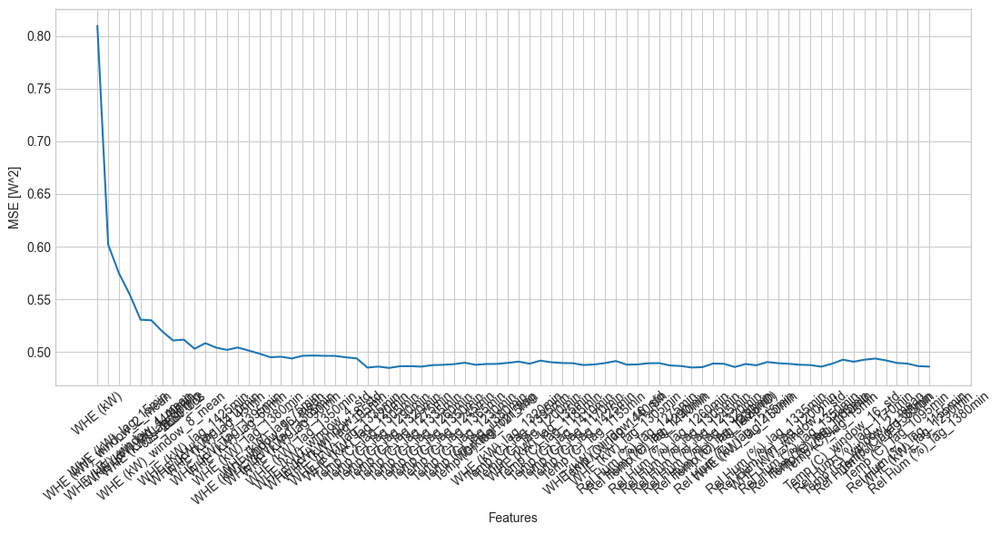

Number of features selected: 28
Selected Features:
['WHE (kW)', 'WHE (kW)_window_2_mean', 'WHE (kW)_lag_15min', 'WHE (kW)_window_4_mean', 'WHE (kW)_lag_1440min', 'WHE (kW)_lag_30min', 'WHE (kW)_window_8_mean', 'cos_2880.0_2', 'hour_cos', 'WHE (kW)_lag_1425min', 'WHE (kW)_lag_1410min', 'WHE (kW)_lag_45min', 'WHE (kW)_lag_1395min', 'WHE (kW)_lag_60min', 'WHE (kW)_lag_1380min', 'WHE (kW)_window_16_mean', 'WHE (kW)_lag_75min', 'WHE (kW)_lag_1365min', 'WHE (kW)_lag_90min', 'WHE (kW)_lag_1350min', 'WHE (kW)_window_4_std', 'WHE (kW)_window_8_std', 'WHE (kW)_lag_105min', 'WHE (kW)_lag_1335min', 'WHE (kW)_lag_120min', 'Temp (C)_lag_1305min', 'Temp (C)_lag_1290min', 'Temp (C)_lag_1320min']


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import pandas as pd

# Initialize RandomForestRegressor
regressor = RandomForestRegressor(
    random_state=42,
    n_jobs=-1
)

# Run Feature Selection
print("Running Feature Selection...")
FirstSeries = FeatureSelection_fixed_test(regressor, DF_features, DF_target, sorted_features)

# Identify best features
features_after_FS1 = keep_indices_till_min(FirstSeries)

# Display Results
print(f"Number of features selected: {len(features_after_FS1)}")
print("Selected Features:")
print(features_after_FS1)


In [ ]:
print(FirstSeries)

WHE (kW)                   0.809452
WHE (kW)_window_2_mean     0.601658
WHE (kW)_lag_15min         0.574337
WHE (kW)_window_4_mean     0.554112
WHE (kW)_lag_1440min       0.530274
                             ...   
Temp (C)_lag_30min         0.491600
Temp (C)_lag_1095min       0.489243
Rel Hum (%)_lag_1155min    0.488544
WHE (kW)_lag_1290min       0.486155
Rel Hum (%)_lag_1380min    0.485740
Length: 78, dtype: float64


In [ ]:
# Save the updated DataFrame back to a CSV file
output_path = 'Selected_features_and_errors_18.02.25_1-6.csv'  # Replace with your desired output path
FirstSeries.to_csv(output_path)
FSname1="selected_features_and_errors_18.02.25_1-6.csv"

# Save the updated DataFrame back to a CSV file
output_path = 'Selected_features_18.02.25_1-6.csv'  # Replace with your desired output path
features_after_FS1_df = pd.DataFrame(features_after_FS1, columns=["Features"])
features_after_FS1_df.to_csv(output_path)


# Nixtla

In [15]:
features_after_FS1_df = pd.read_csv(r'C:\Users\gkeep\OneDrive\Desktop\Thesis_coding\Selected_features_18.02.25_1-6.csv')
features_after_FS1 = features_after_FS1_df["Features"].tolist()
features_after_FS1.append(target)
features_after_FS1

# Mandetory columns
df = df[features_after_FS1]
df["unique_id"]="sc"
df["ds"] = df.index
df = df.rename(columns={target: 'y'})

# Step 1: Determine the number of rows in the DataFrame
total_size = len(df)

# Step 2: Define the number of rows for validation and test sets
validation_test_size = 96*7*2

# Step 3: Split the data
DF_training = df.iloc[:total_size - 2 * validation_test_size]
DF_validation = df.iloc[total_size - 2 * validation_test_size:total_size - validation_test_size]
DF_test = df.iloc[total_size - validation_test_size:]

# Step 4: Verify the sizes of each set
print("Training set size:", len(DF_training))
print("Validation set size:", len(DF_validation))
print("Test set size:", len(DF_test))

Training set size: 14496
Validation set size: 1344
Test set size: 1344


C:\Users\gkeep\AppData\Local\Temp\ipykernel_13236\3408572940.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["unique_id"]="sc"
C:\Users\gkeep\AppData\Local\Temp\ipykernel_13236\3408572940.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["ds"] = df.index


In [16]:
len(features_after_FS1)

29

# Scaling

In [16]:
features_after_FS1.remove(target)
features_after_FS1.append("y")

scaler = MinMaxScaler()
df_scaled = df.copy()
scaler_target = MinMaxScaler()

# Fit the scaler on the numeric columns and transform them
df_scaled[features_after_FS1] = scaler.fit_transform(df[features_after_FS1])

DF_training_scaled = df_scaled.iloc[:total_size - 2 * validation_test_size] #all columns scaled
DF_validation_scaled = df_scaled.iloc[total_size - 2 * validation_test_size:total_size - validation_test_size]
DF_test_scaled = df_scaled.iloc[total_size - validation_test_size:]

scaler_target.fit(DF_training[['y']])

DF_training_validation_scaled=pd.concat([DF_training_scaled,DF_validation_scaled],axis=0)

In [17]:
print("Original y Min/Max:", DF_training["y"].min(), DF_training["y"].max())
print("Scaled y Min/Max:", DF_training_scaled["y"].min(), DF_training_scaled["y"].max())

Original y Min/Max: 0.3857333333333334 8.339733333333333
Scaled y Min/Max: 0.0 1.0


In [18]:
len(DF_training_validation_scaled)

15840

# Model

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
from neuralforecast import NeuralForecast
from neuralforecast.models import NBEATSx
from neuralforecast.losses.pytorch import MSE
from neuralforecast.losses.pytorch import MQLoss
import os

## LSTM

In [ ]:
from neuralforecast import NeuralForecast
from neuralforecast.models import LSTM
import os
import json
import sys
#sys.stdout = open('output_log_LSTM_13.03.25.txt', 'w')

[I 2025-03-13 01:59:58,140] A new study created in memory with name: no-name-bcb56f46-72a0-472a-a2f5-cd3a8ca1ece2
Seed set to 1
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 446 K  | train
4 | context_adapter | Linear        | 1.8 M  | train
5 | mlp_decoder     | MLP           | 18.8 K | train
----------------------------------------------------------
2.2 M     Trainable params
0         Non-trainable params
2.2 M     Total params
8.975     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode
`Trainer.fit` stopped: `max_ste

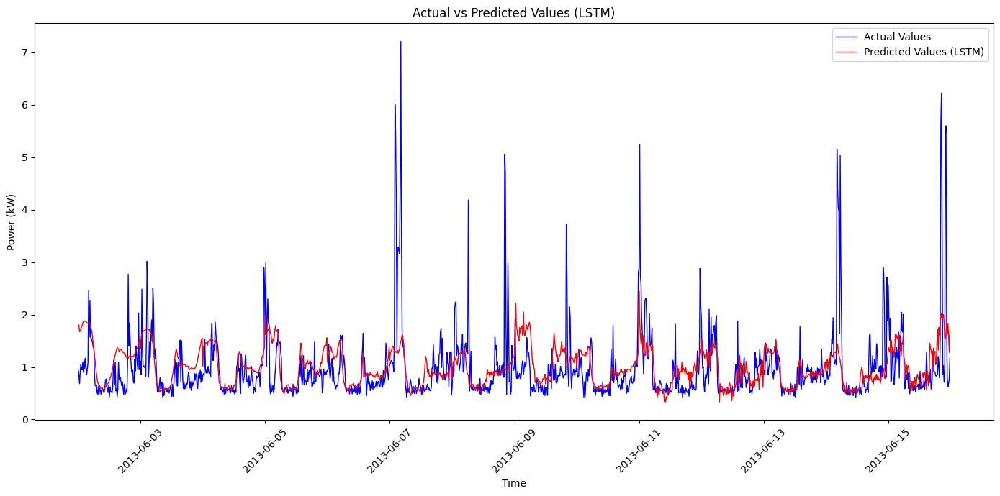

In [ ]:
modelname="LSTM"

def sliding_window_forecast_LSTM_Optuna(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=14496):

    # Create output directory if it doesn't exist
    output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\LSTM_13.03_n=100"
    os.makedirs(output_dir, exist_ok=True)

    # Split future and past features
    future_features, past_features = separate_future_past_features(features_after_FS1)
    past_features.remove("y")
    mandatory_columns = ["unique_id", "ds", "y"]
    mandatory_columns_future = ["unique_id", "ds"]

    # Define Optuna objective function
    def objectiveLSTM(trial):
        all_preds = pd.DataFrame()
        total_rows = len(DF_training_validation_scaled)
        num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps

        # Suggest hyperparameters
        learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-2)
        batch_size = trial.suggest_categorical('batch_size', [32, 64, 128])
        hidden_size = trial.suggest_int('hidden_size', 32, 192, step=32)
        encoder_n_layers = trial.suggest_int('encoder_n_layers', 1, 3)
        decoder_layers = trial.suggest_int('decoder_layers', 1, 3)
        num_lr_decays = trial.suggest_int('num_lr_decays', 1, 5)

        # Initialize LSTM model
        fcst = NeuralForecast(
            models=[LSTM(
                h=prediction_horizon_steps,
                input_size=7 * prediction_horizon_steps,
                loss=MSE(),
                scaler_type='robust',
                encoder_n_layers=encoder_n_layers,
                encoder_hidden_size=hidden_size,
                context_size=prediction_horizon_steps,
                decoder_hidden_size=hidden_size,
                decoder_layers=decoder_layers,
                max_steps=1200,
                val_check_steps=10,
                early_stop_patience_steps=-1,
                learning_rate=learning_rate,
                num_lr_decays=num_lr_decays,
                batch_size=batch_size
            )],
            freq="15min"
        )

        # Loop through data splits
        for i in range(num_iterations):
            start_train_idx = i * prediction_horizon_steps
            end_train_idx = start_train_idx + fixed_training_size
            DF_training_scaled = DF_training_validation_scaled.iloc[start_train_idx:end_train_idx]

            start_val_idx = end_train_idx
            end_val_idx = start_val_idx + prediction_horizon_steps
            DF_validation_scaled = DF_training_validation_scaled.iloc[start_val_idx:end_val_idx]

            # Fit and predict
            fcst.fit(df=DF_training_scaled[future_features + past_features + mandatory_columns], val_size=prediction_horizon_steps)
            preds = fcst.predict(futr_df=DF_validation_scaled[future_features + mandatory_columns_future])

            # Inverse scaling
            predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
            predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

            preds[modelname + "_unscaled"] = predictions_original_scale
            all_preds = pd.concat([all_preds, preds], axis=0)

        all_preds.set_index('ds', inplace=True)

        # Calculate error (MSE)
        name = modelname + "_val"
        d = ErrorCalculator(name, DF_validation["y"], all_preds[modelname + "_unscaled"])

        return d["MSE"]

    # Optimize hyperparameters using Optuna
    studyLSTM = optuna.create_study(
        direction='minimize',
        sampler=optuna.samplers.TPESampler(n_startup_trials=10),
        pruner=optuna.pruners.HyperbandPruner()
    )
    studyLSTM.optimize(objectiveLSTM, n_trials=100)  # Set n_trials=2 for faster optimization

    # Save best parameters
    best_params = studyLSTM.best_trial.params
    best_params_path = os.path.join(output_dir, f"{modelname}_best_params.json")
    with open(best_params_path, "w") as f:
        json.dump(best_params, f, indent=4)
    print(f"Best parameters saved to {best_params_path}")


    # Get best parameters and retrain
    fcst = NeuralForecast(
        models=[LSTM(
            h=prediction_horizon_steps,
            input_size=7 * prediction_horizon_steps,
            loss=MSE(),
            scaler_type='robust',
            encoder_n_layers=best_params['encoder_n_layers'],
            encoder_hidden_size=best_params['hidden_size'],
            context_size=prediction_horizon_steps,
            decoder_hidden_size=best_params['hidden_size'],
            decoder_layers=best_params['decoder_layers'],
            max_steps=1200,
            val_check_steps=10,
            early_stop_patience_steps=-1,
            learning_rate=best_params['learning_rate'],
            num_lr_decays=best_params['num_lr_decays'],
            batch_size=best_params['batch_size']
        )],
        freq="15min"
    )

    final_all_preds = pd.DataFrame()
    total_rows = len(DF_training_validation_scaled)
    num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps

    for i in range(num_iterations):
        start_train_idx = i * prediction_horizon_steps
        end_train_idx = start_train_idx + fixed_training_size
        DF_training_scaled = DF_training_validation_scaled.iloc[start_train_idx:end_train_idx]

        start_val_idx = end_train_idx
        end_val_idx = start_val_idx + prediction_horizon_steps
        DF_validation_scaled = DF_training_validation_scaled.iloc[start_val_idx:end_val_idx]

        # Fit and predict with best hyperparameters
        fcst.fit(df=DF_training_scaled[future_features + past_features + mandatory_columns], val_size=prediction_horizon_steps)
        preds = fcst.predict(futr_df=DF_validation_scaled[future_features + mandatory_columns_future])

        # Inverse scaling
        predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
        predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

        preds[modelname + "_unscaled"] = predictions_original_scale
        final_all_preds = pd.concat([final_all_preds, preds], axis=0)
        print(len(final_all_preds))

    final_all_preds.set_index('ds', inplace=True)

    # Save final predictions
    final_preds_path = os.path.join(output_dir, f"{modelname}_final_predictions.csv")
    final_all_preds.to_csv(final_preds_path)
    print(f"Final predictions saved to {final_preds_path}")

    # Plot final predictions
    plot_predictions(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])

    return studyLSTM, final_all_preds

# Example usage
studyLSTM, final_all_preds = sliding_window_forecast_LSTM_Optuna(
    "LSTM", features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=14496
)


In [ ]:
ErrorCalculator(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])


{'Pipelines': 'LSTM',
 'RMSE': np.float64(0.6142673904907501),
 'MAE': np.float64(0.35008422437951203),
 'MSE': np.float64(0.37732442702031566),
 'PRMSE': np.float64(2.864582086475185)}

## TCN

In [ ]:
from neuralforecast.models import TCN
import os
import json
import sys
#sys.stdout = open('output_log_TCN_28.02.25_100.txt', 'w')

[I 2025-02-28 01:37:32,844] A new study created in memory with name: no-name-77baac03-91c6-461d-83e4-7c3d3ba792d2
c:\Users\gkeep\anaconda3\envs\Trafo\Lib\site-packages\optuna\distributions.py:524: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (1, 2, 4, 8, 16) which is of type tuple.
  warnings.warn(message)
c:\Users\gkeep\anaconda3\envs\Trafo\Lib\site-packages\optuna\distributions.py:524: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (1, 3, 6, 9, 12) which is of type tuple.
  warnings.warn(message)
c:\Users\gkeep\anaconda3\envs\Trafo\Lib\site-packages\optuna\distributions.py:524: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (1, 2, 5, 10, 20) which is of type tuple.
  warnings.warn(message)
Seed set to 1
GPU 

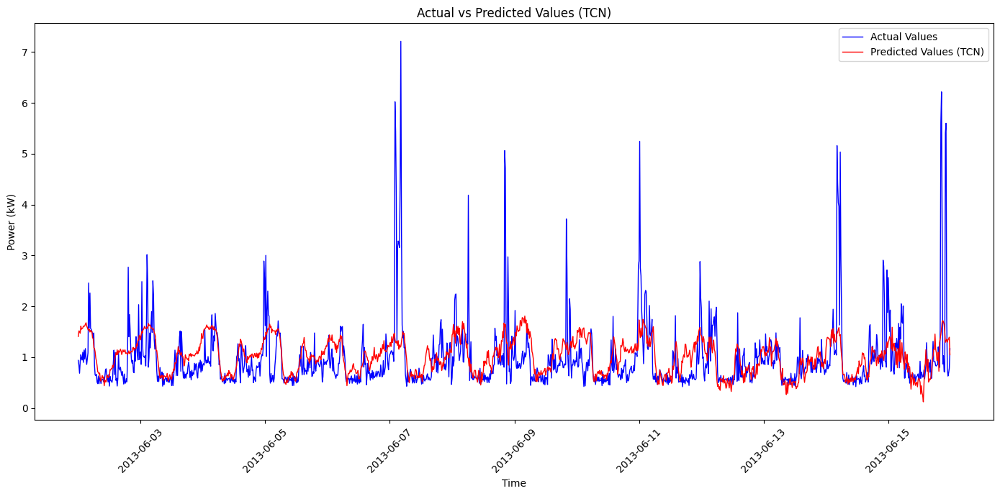

In [ ]:
modelname = "TCN"

def sliding_window_forecast_TCN(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=14496):

    # Create output directory if it doesn't exist
    output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TCN_28.02_n=100_256"
    os.makedirs(output_dir, exist_ok=True)


    # Split future and past features
    future_features, past_features = separate_future_past_features(features_after_FS1)
    past_features.remove("y")
    mandatory_columns = ["unique_id", "ds", "y"]
    mandatory_columns_future = ["unique_id", "ds"]

    def objectiveTCN(trial):
        all_preds = pd.DataFrame()
        total_rows = len(DF_training_validation_scaled)
        num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps

        # Determine the number of unique series
        n_series = DF_training_validation_scaled['unique_id'].nunique()

        # Suggest hyperparameters
        learning_rate = trial.suggest_float('learning_rate', 1e-6, 1e-2 ,log=True)
        batch_size = trial.suggest_categorical('batch_size', [32, 64])
        kernel_size = trial.suggest_int('kernel_size', 2, 5)
        dilations = trial.suggest_categorical('dilations', ((1, 2, 4, 8, 16), (1, 3, 6, 9, 12),(1, 2, 5, 10, 20)))
        encoder_hidden_size = trial.suggest_int('encoder_hidden_size', 64, 256, step=64)
        decoder_hidden_size = trial.suggest_int('decoder_hidden_size', 64, 256, step=64)
        decoder_layers = trial.suggest_int('decoder_layers', 1, 4)
        # Initialize TCN model
        fcst = NeuralForecast(
            models=[TCN(
                h=prediction_horizon_steps,
                input_size= 7*prediction_horizon_steps,
                kernel_size=kernel_size,
                dilations=dilations,
                encoder_hidden_size=encoder_hidden_size,
                decoder_hidden_size=decoder_hidden_size,
                decoder_layers=decoder_layers,
                max_steps=1000,
                early_stop_patience_steps=-1,
                val_check_steps=50,
                learning_rate=learning_rate,
                loss=MSE(),
                batch_size=batch_size
            )],
            freq="15min"
        )

        for i in range(num_iterations):
            start_train_idx = i * prediction_horizon_steps
            end_train_idx = start_train_idx + fixed_training_size
            DF_training_scaled = DF_training_validation_scaled.iloc[start_train_idx:end_train_idx]

            start_val_idx = end_train_idx
            end_val_idx = start_val_idx + prediction_horizon_steps
            DF_validation_scaled = DF_training_validation_scaled.iloc[start_val_idx:end_val_idx]

            # Fit and predict
            fcst.fit(df=DF_training_scaled[future_features + past_features + mandatory_columns], val_size=prediction_horizon_steps)
            preds = fcst.predict(futr_df=DF_validation_scaled[future_features + mandatory_columns_future])

            # Inverse scale predictions
            predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
            predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

            preds[modelname + "_unscaled"] = predictions_original_scale
            all_preds = pd.concat([all_preds, preds], axis=0)
            print(len(all_preds))
        all_preds.set_index('ds', inplace=True)

        # Calculate error
        name = modelname + "_val"
        d = ErrorCalculator(name, DF_validation["y"], all_preds[modelname + "_unscaled"])

        return d["MSE"]
    # Optuna study for hyperparameter optimization
    studyTCN = optuna.create_study(
        direction='minimize',
        sampler=optuna.samplers.TPESampler(n_startup_trials=10),
        pruner=optuna.pruners.HyperbandPruner()
    )
    studyTCN.optimize(objectiveTCN, n_trials=100)

    # Save best parameters
    best_params = studyTCN.best_trial.params
    best_params_path = os.path.join(output_dir, f"{modelname}_best_params.json")
    with open(best_params_path, "w") as f:
        json.dump(best_params, f, indent=4)
    print(f"Best parameters saved to {best_params_path}")


    # Get the best trial parameters and retrain
    fcst = NeuralForecast(
        models=[TCN(
            h=prediction_horizon_steps,
            input_size=7 * prediction_horizon_steps,
            kernel_size=best_params['kernel_size'],
            dilations=best_params['dilations'],
            encoder_hidden_size=best_params['encoder_hidden_size'],
            decoder_hidden_size=best_params['decoder_hidden_size'],
            decoder_layers=best_params['decoder_layers'],
            max_steps=1200,
            early_stop_patience_steps=-1,
            val_check_steps=50,
            learning_rate=best_params['learning_rate'],
            loss=MSE(),
            batch_size=best_params['batch_size']
        )],
        freq="15min"
    )

    final_all_preds = pd.DataFrame()
    total_rows = len(DF_training_validation_scaled)
    num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps

    for i in range(num_iterations):
        start_train_idx = i * prediction_horizon_steps
        end_train_idx = start_train_idx + fixed_training_size
        DF_training_scaled = DF_training_validation_scaled.iloc[start_train_idx:end_train_idx]

        start_val_idx = end_train_idx
        end_val_idx = start_val_idx + prediction_horizon_steps
        DF_validation_scaled = DF_training_validation_scaled.iloc[start_val_idx:end_val_idx]

        # Fit and predict using the best hyperparameters
        fcst.fit(df=DF_training_scaled[future_features + past_features + mandatory_columns], val_size=prediction_horizon_steps)
        preds = fcst.predict(futr_df=DF_validation_scaled[future_features + mandatory_columns_future])

        # Inverse scaling and storing final predictions
        predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
        predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

        preds[modelname + "_unscaled"] = predictions_original_scale
        final_all_preds = pd.concat([final_all_preds, preds], axis=0)
        print(len(final_all_preds))


    final_all_preds.set_index('ds', inplace=True)

    # Save final predictions
    final_preds_path = os.path.join(output_dir, f"{modelname}_final_predictions.csv")
    final_all_preds.to_csv(final_preds_path)
    print(f"Final predictions saved to {final_preds_path}")

    #Plot Predictions
    plot_predictions(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])

    #Calculate error
    ErrorCalculator(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])

    return studyTCN, final_all_preds

# Example usage
studyTCN, final_all_preds = sliding_window_forecast_TCN(
    modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=14496
)


In [ ]:
ErrorCalculator(modelname, DF_validation['y'], final_all_preds['TCN_unscaled'])

{'Pipelines': 'TCN',
 'RMSE': np.float64(0.6152207751908394),
 'MAE': np.float64(0.3577638781851749),
 'MSE': np.float64(0.3784966022264174),
 'PRMSE': np.float64(2.8908348189026394)}

## TSMixerx

In [ ]:
from neuralforecast.models import TSMixerx
import os
import json
import sys
#sys.stdout = open('output_log_TSMixersx_01.03.25_100.txt', 'w')

[I 2025-03-01 02:09:05,466] A new study created in memory with name: no-name-fff9b12b-e30b-4b57-89ee-93ea3602f33c
C:\Users\gkeep\AppData\Local\Temp\ipykernel_20428\1725029962.py:25: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 1e-2)  # FIXED
Seed set to 1


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Tra

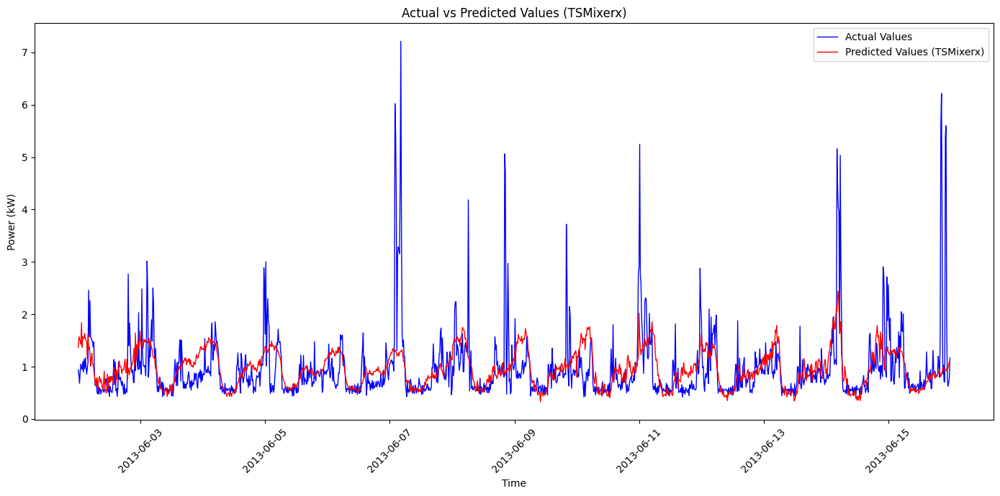

In [ ]:
modelname = "TSMixerx"

def sliding_window_forecast_TSMixerx(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=14496):

    # Create output directory if it doesn't exist
    output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TSMixerx_01.03_n=100_256"
    os.makedirs(output_dir, exist_ok=True)

    # Split future and past features
    future_features, past_features = separate_future_past_features(features_after_FS1)
    past_features.remove("y")
    mandatory_columns = ["unique_id", "ds", "y"]
    mandatory_columns_future = ["unique_id", "ds"]

    def objectiveTSMixerx(trial):
        all_preds = pd.DataFrame()
        total_rows = len(DF_training_validation_scaled)
        num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps

        # Determine the number of unique series
        n_series = DF_training_validation_scaled['unique_id'].nunique()

        # Suggest hyperparameters
        dropout = trial.suggest_float('dropout', 0.0, 0.5)  # FIXED
        learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 1e-2)  # FIXED
        batch_size = trial.suggest_categorical('batch_size', [32, 64, 128])

        # Initialize TSMixerx model
        fcst = NeuralForecast(
            models=[TSMixerx(
                h=prediction_horizon_steps,
                input_size=7*prediction_horizon_steps,
                n_block=8,
                n_series=n_series,
                ff_dim=16,
                revin=True,
                scaler_type='robust',
                dropout=dropout,
                max_steps=1200,
                early_stop_patience_steps=-1,
                val_check_steps=10,
                learning_rate=learning_rate,
                loss=MSE(),
                batch_size=batch_size
            )],
            freq="15min"
        )

        for i in range(num_iterations):
            start_train_idx = i * prediction_horizon_steps
            end_train_idx = start_train_idx + fixed_training_size
            DF_training_scaled = DF_training_validation_scaled.iloc[start_train_idx:end_train_idx]

            start_val_idx = end_train_idx
            end_val_idx = start_val_idx + prediction_horizon_steps
            DF_validation_scaled = DF_training_validation_scaled.iloc[start_val_idx:end_val_idx]

            # Fit and predict
            fcst.fit(df=DF_training_scaled[future_features + past_features + mandatory_columns], val_size=prediction_horizon_steps)
            preds = fcst.predict(futr_df=DF_validation_scaled[future_features + mandatory_columns_future])

            # Inverse scale predictions
            predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
            predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

            preds[modelname + "_unscaled"] = predictions_original_scale
            all_preds = pd.concat([all_preds, preds], axis=0)
            print(len(all_preds))
        all_preds.set_index('ds', inplace=True)

        # Calculate error
        name = modelname + "_val"
        d = ErrorCalculator(name, DF_validation["y"], all_preds[modelname + "_unscaled"])
        return d["MSE"]

    # Optuna study for hyperparameter optimization
    studyTSMixerx = optuna.create_study(
        direction='minimize',
        sampler=optuna.samplers.TPESampler(n_startup_trials=10),
        pruner=optuna.pruners.HyperbandPruner()
    )
    studyTSMixerx.optimize(objectiveTSMixerx, n_trials=100)

    # Save best parameters
    best_params = studyTSMixerx.best_trial.params
    best_params_path = os.path.join(output_dir, f"{modelname}_best_params.json")
    with open(best_params_path, "w") as f:
        json.dump(best_params, f, indent=4)
    print(f"Best parameters saved to {best_params_path}")

    # Get the best trial parameters and retrain
    fcst = NeuralForecast(
        models=[TSMixerx(
            h=prediction_horizon_steps,
            input_size=7*prediction_horizon_steps,
            n_block=8,
            n_series = DF_training_validation_scaled['unique_id'].nunique(),
            ff_dim=16,
            revin=True,
            scaler_type='robust',
            dropout=best_params['dropout'],
            max_steps=1200,
            early_stop_patience_steps=-1,
            val_check_steps=10,
            learning_rate=best_params['learning_rate'],
            loss=MSE(),
            batch_size=best_params['batch_size']
        )],
        freq="15min"
    )

    final_all_preds = pd.DataFrame()
    total_rows = len(DF_training_validation_scaled)
    num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps

    for i in range(num_iterations):
        start_train_idx = i * prediction_horizon_steps
        end_train_idx = start_train_idx + fixed_training_size
        DF_training_scaled = DF_training_validation_scaled.iloc[start_train_idx:end_train_idx]

        start_val_idx = end_train_idx
        end_val_idx = start_val_idx + prediction_horizon_steps
        DF_validation_scaled = DF_training_validation_scaled.iloc[start_val_idx:end_val_idx]

        # Fit and predict using the best hyperparameters
        fcst.fit(df=DF_training_scaled[future_features + past_features + mandatory_columns], val_size=prediction_horizon_steps)
        preds = fcst.predict(futr_df=DF_validation_scaled[future_features + mandatory_columns_future])

        # Inverse scaling and storing final predictions
        predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
        predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

        preds[modelname + "_unscaled"] = predictions_original_scale
        final_all_preds = pd.concat([final_all_preds, preds], axis=0)
        print(len(final_all_preds))
    final_all_preds.set_index('ds', inplace=True)

    # Save final predictions
    final_preds_path = os.path.join(output_dir, f"{modelname}_final_predictions.csv")
    final_all_preds.to_csv(final_preds_path)
    print(f"Final predictions saved to {final_preds_path}")

    #Plot Predictions
    plot_predictions(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])

    #Calculate error
    ErrorCalculator(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])

    return studyTSMixerx, final_all_preds

# Example usage
studyTSMixerx, final_all_preds = sliding_window_forecast_TSMixerx(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=14496)


In [ ]:
ErrorCalculator(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])


{'Pipelines': 'TSMixerx',
 'RMSE': np.float64(0.6251347324321674),
 'MAE': np.float64(0.3342171664898831),
 'MSE': np.float64(0.3907934336930376),
 'PRMSE': np.float64(3.1370667030502277)}

## NBeatsx

In [21]:
from neuralforecast.models import NBEATSx
import os
import json
import sys
from neuralforecast.losses.pytorch import MSE

#sys.stdout = open('output_log_NBEATSx_15.05.25_100.txt', 'w')

[I 2025-05-15 12:48:20,459] A new study created in memory with name: no-name-665c9a4c-b433-4713-8cf3-46b40ec66ae1
Seed set to 1
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 674 K  | train
-------------------------------------------------------
377 K     Trainable params
296 K     Non-trainable params
674 K     Total params
2.697     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode
`Trainer.fit` stopped: `max_steps=1200` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 

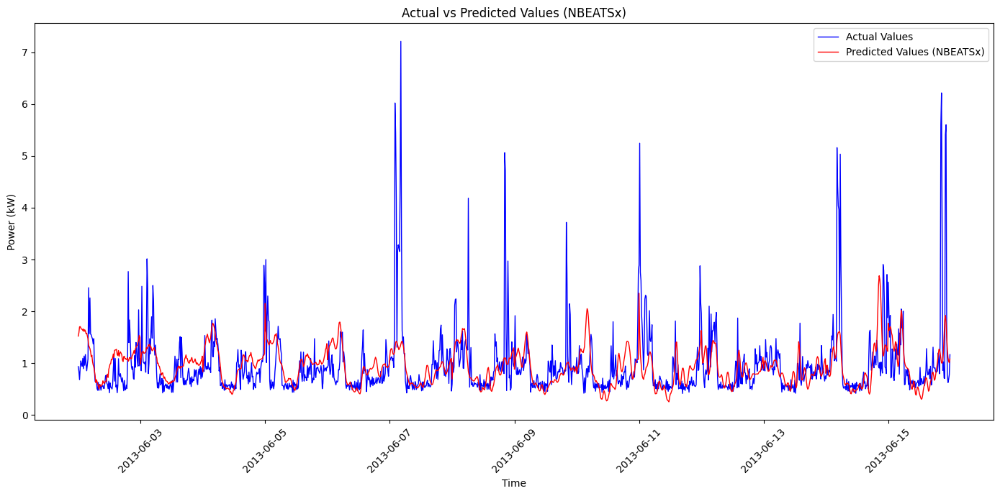

In [22]:
modelname = "NBEATSx"

def sliding_window_forecast_KAN(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=14496):


    output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\Trial\NBEATSx_15.05_n=100"
    os.makedirs(output_dir, exist_ok=True)

    future_features, past_features = separate_future_past_features(features_after_FS1)
    past_features.remove("y")
    mandatory_columns = ["unique_id", "ds", "y"]
    mandatory_columns_future = ["unique_id", "ds"]

    def objectiveKAN(trial):
        all_preds = pd.DataFrame()
        total_rows = len(DF_training_validation_scaled)
        num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps

        n_blocks = [trial.suggest_int('n_id',  1, 4),trial.suggest_int('n_tr',  1, 4),trial.suggest_int('n_se',  1, 4)]
        mlp_size = trial.suggest_int('mlp', 32, 128, step=32)   # one width for all stacks
        mlp_units = [[mlp_size, mlp_size]] * 3                  # 3 stacks → [[w,w],[w,w],[w,w]]
        dropout_prob_sug = trial.suggest_float('dropout_prob_theta', 0.0, 0.5)
        learning_rate_sug = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)
        batch_size_sug = trial.suggest_categorical('batch_size', [16, 32, 64, 128])

        fcst = NeuralForecast(
            models=[NBEATSx(
                h=prediction_horizon_steps,
                input_size=7*prediction_horizon_steps,
                stack_types=['identity','trend','seasonality'],
                n_blocks=n_blocks,
                mlp_units=mlp_units,
                dropout_prob_theta=dropout_prob_sug,
                loss=MSE(),
                max_steps=1200,
                learning_rate=learning_rate_sug,
                batch_size=batch_size_sug,
                early_stop_patience_steps=-1,
                val_check_steps=10
            )],
            freq="15min"
        )

        for i in range(num_iterations):
            start_train_idx = i * prediction_horizon_steps
            end_train_idx = start_train_idx + fixed_training_size
            DF_training_scaled = DF_training_validation_scaled.iloc[start_train_idx:end_train_idx]

            start_val_idx = end_train_idx
            end_val_idx = start_val_idx + prediction_horizon_steps
            DF_validation_scaled = DF_training_validation_scaled.iloc[start_val_idx:end_val_idx]

            fcst.fit(df=DF_training_scaled[future_features + past_features + mandatory_columns], val_size=prediction_horizon_steps)
            preds = fcst.predict(futr_df=DF_validation_scaled[future_features + mandatory_columns_future])

            predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
            predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

            preds[modelname + "_unscaled"] = predictions_original_scale
            all_preds = pd.concat([all_preds, preds], axis=0)
            print(len(all_preds))

        all_preds.set_index('ds', inplace=True)
        name = modelname + "_val"
        d = ErrorCalculator(name, DF_validation["y"], all_preds[modelname + "_unscaled"])

        # Save structured attributes
        trial.set_user_attr("n_blocks", n_blocks)
        trial.set_user_attr("mlp_units", mlp_units)

        return d["MSE"]

    studyNBEATSx = optuna.create_study(
        direction='minimize',
        sampler=optuna.samplers.TPESampler(n_startup_trials=10),
        pruner=optuna.pruners.HyperbandPruner()
    )
    studyNBEATSx.optimize(objectiveKAN, n_trials=100)
    
    # ------------------------------------------------------------------
    # After Optuna finished -– extract the winning hyper-parameters
    # ------------------------------------------------------------------
    best_trial   = studyNBEATSx.best_trial
    best_params  = best_trial.params                 # scalars
    best_blocks  = best_trial.user_attrs['n_blocks'] # list like [2,1,3]
    best_mlp_sz  = best_params['mlp']                # e.g. 96

    # ---------  FIX: build the dict you want to save  ------------------
    best_config = {          # <--  this was missing
        'n_blocks'            : best_blocks,
        'mlp_units'           : [[best_mlp_sz, best_mlp_sz]] * 3,
        'dropout_prob_theta'  : best_params['dropout_prob_theta'],
        'learning_rate'       : best_params['learning_rate'],
        'batch_size'          : best_params['batch_size']
    }
    # ------------------------------------------------------------------

    best_params_path = os.path.join(output_dir,
                                    f"{modelname}_best_params.json")
    with open(best_params_path, "w") as f:
        json.dump(best_config, f, indent=4)
    print(f"Best parameters saved to {best_params_path}")

    # You can reload them later if you like:
    # with open(best_params_path) as f:
    #     best_config = json.load(f)

    # Use the same objects to build the final model
    best_mlp_units = best_config['mlp_units']


    fcst = NeuralForecast(
        models=[NBEATSx(
            h=prediction_horizon_steps,
            input_size=7*prediction_horizon_steps,
            stack_types=['identity','trend','seasonality'],
            n_blocks=best_blocks,
            mlp_units=best_mlp_units,
            loss=MSE(),
            scaler_type='robust',
            dropout_prob_theta=best_params['dropout_prob_theta'],
            max_steps=1200,
            val_check_steps=10,
            early_stop_patience_steps=-1,
            learning_rate=best_params['learning_rate'],
            batch_size=best_params['batch_size']
        )],
        freq="15min"
    )

    final_all_preds = pd.DataFrame()
    total_rows = len(DF_training_validation_scaled)
    num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps

    for i in range(num_iterations):
        start_train_idx = i * prediction_horizon_steps
        end_train_idx = start_train_idx + fixed_training_size

        DF_training_scaled = DF_training_validation_scaled.iloc[start_train_idx:end_train_idx]
        start_val_idx = end_train_idx
        end_val_idx = start_val_idx + prediction_horizon_steps
        DF_validation_scaled = DF_training_validation_scaled.iloc[start_val_idx:end_val_idx]

        fcst.fit(df=DF_training_scaled[future_features + past_features + mandatory_columns], val_size=prediction_horizon_steps)
        preds = fcst.predict(futr_df=DF_validation_scaled[future_features + mandatory_columns_future])

        predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
        predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

        preds[modelname + "_unscaled"] = predictions_original_scale
        final_all_preds = pd.concat([final_all_preds, preds], axis=0)
        print(len(final_all_preds))

    final_all_preds.set_index('ds', inplace=True)
    final_preds_path = os.path.join(output_dir, f"{modelname}_final_predictions.csv")
    final_all_preds.to_csv(final_preds_path)
    print(f"Final predictions saved to {final_preds_path}")

    plot_predictions(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])
    ErrorCalculator(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])

    return studyNBEATSx, final_all_preds

# Example usage
studyNBEATSx, final_all_preds = sliding_window_forecast_KAN(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=14496)



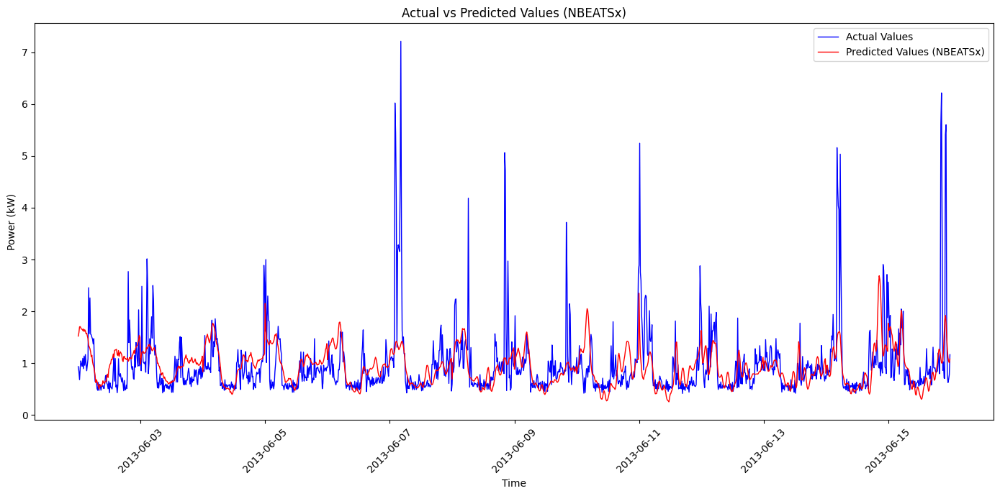

In [23]:
plot_predictions(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])


In [28]:
ErrorCalculator(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])


{'Pipelines': 'NBEATSx',
 'RMSE': np.float64(0.961572968558035),
 'MAE': np.float64(0.6321710916390754),
 'MSE': np.float64(0.9246225738615117),
 'PRMSE': np.float64(3.253318231425793)}

## KAN

In [ ]:
from neuralforecast.models import KAN
import os
import json
import sys
sys.stdout = open('output_log_KAN_11.03.25_100.txt', 'w')

[I 2025-03-11 23:45:40,975] A new study created in memory with name: no-name-d5433e2b-efcb-4d99-aed0-6dec7593132f
Seed set to 1
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 344 K  | train
-------------------------------------------------------
344 K     Trainable params
0         Non-trainable params
344 K     Total params
1.376     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode
`Trainer.fit` stopped: `max_steps=780` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0

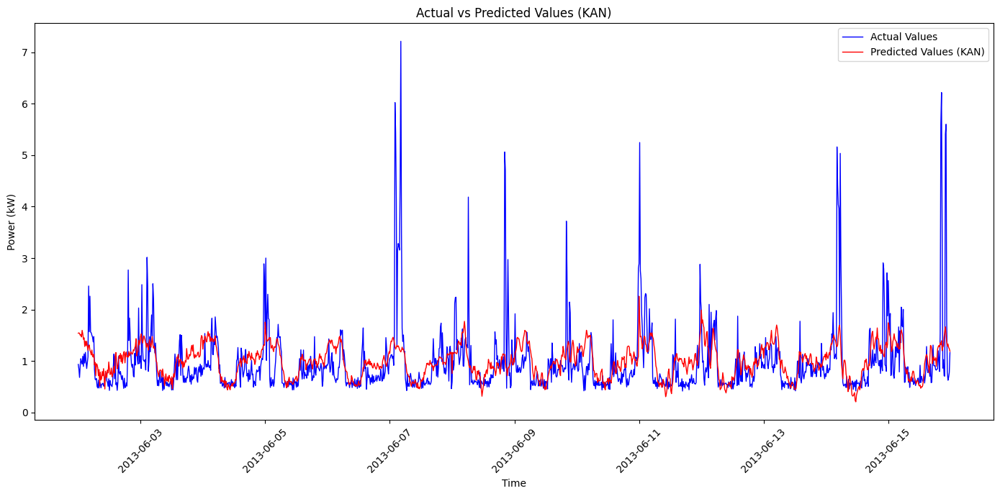

In [ ]:
modelname = "KAN"

def sliding_window_forecast_KAN(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=14496):

    # Create output directory if it doesn't exist
    output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\KAN_11.03_n=100"
    os.makedirs(output_dir, exist_ok=True)

    # Split future and past features
    future_features, past_features = separate_future_past_features(features_after_FS1)
    past_features.remove("y")
    mandatory_columns = ["unique_id", "ds", "y"]
    mandatory_columns_future = ["unique_id", "ds"]

    def objectiveKAN(trial):
        all_preds = pd.DataFrame()
        total_rows = len(DF_training_validation_scaled)
        num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps

        # Suggest hyperparameters for KAN
        hidden_size_sug = trial.suggest_int('hidden_size', 32, 96, step=32)
        grid_size_sug = trial.suggest_int('grid_size', 3, 8)
        spline_order_sug = trial.suggest_int('spline_order', 2, 4)
        n_hidden_layers_sug = trial.suggest_int('n_hidden_layers', 1, 4)  # Number of hidden layers
        learning_rate_sug = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)
        batch_size_sug = trial.suggest_categorical('batch_size', [8, 16, 32])

        # Initialize KAN model
        fcst = NeuralForecast(
            models=[KAN(
                h=prediction_horizon_steps,
                input_size=7 * prediction_horizon_steps,
                hidden_size=hidden_size_sug,
                grid_size=grid_size_sug,
                spline_order=spline_order_sug,
                n_hidden_layers=n_hidden_layers_sug,
                learning_rate=learning_rate_sug,
                batch_size=batch_size_sug,
                max_steps=780,
                val_check_steps=65,
                loss=MSE(),
            )],
            freq='15min'
        )

        # Loop to split the data
        for i in range(num_iterations):
            start_train_idx = i * prediction_horizon_steps
            end_train_idx = start_train_idx + fixed_training_size
            DF_training_scaled = DF_training_validation_scaled.iloc[start_train_idx:end_train_idx]

            start_val_idx = end_train_idx
            end_val_idx = start_val_idx + prediction_horizon_steps
            DF_validation_scaled = DF_training_validation_scaled.iloc[start_val_idx:end_val_idx]

            # Fit and predict using KAN model
            fcst.fit(df=DF_training_scaled[future_features + past_features + mandatory_columns], val_size=prediction_horizon_steps)
            preds = fcst.predict(futr_df=DF_validation_scaled[future_features + mandatory_columns_future])

            # Inverse scale predictions
            predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
            predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

            # Store unscaled predictions
            preds[modelname + "_unscaled"] = predictions_original_scale
            all_preds = pd.concat([all_preds, preds], axis=0)
            print(len(all_preds))

        all_preds.set_index('ds', inplace=True)

        # Calculate error
        name = modelname + "_val"
        d = ErrorCalculator(name, DF_validation["y"], all_preds[modelname + "_unscaled"])

        return d["MSE"]

    # Optuna study for hyperparameter optimization
    studyKAN = optuna.create_study(
        direction='minimize',
        sampler=optuna.samplers.TPESampler(n_startup_trials=10),
        pruner=optuna.pruners.HyperbandPruner()
    )
    studyKAN.optimize(objectiveKAN, n_trials=100) #make n_trials=2

    # Save best parameters
    best_params = studyKAN.best_trial.params
    best_params_path = os.path.join(output_dir, f"{modelname}_best_params.json")
    with open(best_params_path, "w") as f:
        json.dump(best_params, f, indent=4)
    print(f"Best parameters saved to {best_params_path}")

    # Get the best trial parameters and retrain
    fcst = NeuralForecast(
        models=[KAN(
            h=prediction_horizon_steps,
            input_size=7 * prediction_horizon_steps,
            hidden_size=best_params['hidden_size'],
            grid_size=best_params['grid_size'],
            spline_order=best_params['spline_order'],
            n_hidden_layers=best_params['n_hidden_layers'],
            learning_rate=best_params['learning_rate'],
            batch_size=best_params['batch_size'],
            max_steps=780,
            val_check_steps=65,
            loss=MSE(),
        )],
        freq='15min'
    )

    final_all_preds = pd.DataFrame()
    total_rows = len(DF_training_validation_scaled)
    num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps

    for i in range(num_iterations):
        start_train_idx = i * prediction_horizon_steps
        end_train_idx = start_train_idx + fixed_training_size

        DF_training_scaled = DF_training_validation_scaled.iloc[start_train_idx:end_train_idx]
        start_val_idx = end_train_idx
        end_val_idx = start_val_idx + prediction_horizon_steps
        DF_validation_scaled = DF_training_validation_scaled.iloc[start_val_idx:end_val_idx]

        # Fit and predict using the best hyperparameters
        fcst.fit(df=DF_training_scaled[future_features + past_features + mandatory_columns], val_size=prediction_horizon_steps)
        preds = fcst.predict(futr_df=DF_validation_scaled[future_features + mandatory_columns_future])

        # Inverse scaling and storing final predictions
        predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
        predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

        preds[modelname + "_unscaled"] = predictions_original_scale
        final_all_preds = pd.concat([final_all_preds, preds], axis=0)

    final_all_preds.set_index('ds', inplace=True)

    # Save final predictions
    final_preds_path = os.path.join(output_dir, f"{modelname}_final_predictions.csv")
    final_all_preds.to_csv(final_preds_path)
    print(f"Final predictions saved to {final_preds_path}")

    #Plot Predictions
    plot_predictions(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])

    #Calculate error
    ErrorCalculator(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])

    return studyKAN, final_all_preds

# Example usage
studyKAN, final_all_preds = sliding_window_forecast_KAN(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=14496)


In [ ]:
ErrorCalculator(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])


{'Pipelines': 'KAN',
 'RMSE': np.float64(0.6076671218685983),
 'MAE': np.float64(0.3426779253333689),
 'MSE': np.float64(0.3692593310000659),
 'PRMSE': np.float64(2.9302956009581704)}

## Lightgbm

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
import lightgbm as lgb
import optuna
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import os
import json
import sys

In [ ]:
target

'WHE (kW)_+lag1440'

[I 2025-03-03 19:36:12,823] A new study created in memory with name: no-name-5166dbc6-b297-4528-ab53-8bad0fca6854


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000444 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [In

[I 2025-03-03 19:36:27,192] Trial 0 finished with value: 0.7403856635778092 and parameters: {'num_leaves': 68, 'learning_rate': 0.07846320204169938, 'n_estimators': 834, 'max_depth': -1}. Best is trial 0 with value: 0.7403856635778092.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [In

[I 2025-03-03 19:36:31,560] Trial 1 finished with value: 0.6936532546418345 and parameters: {'num_leaves': 54, 'learning_rate': 0.01893535277247667, 'n_estimators': 389, 'max_depth': -1}. Best is trial 1 with value: 0.6936532546418345.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:36:44,968] Trial 2 finished with value: 0.7027407207289251 and parameters: {'num_leaves': 98, 'learning_rate': 0.011044917552919357, 'n_estimators': 631, 'max_depth': 20}. Best is trial 1 with value: 0.6936532546418345.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:36:53,013] Trial 3 finished with value: 0.7429375185152347 and parameters: {'num_leaves': 70, 'learning_rate': 0.08748511962472771, 'n_estimators': 807, 'max_depth': 10}. Best is trial 1 with value: 0.6936532546418345.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:36:57,269] Trial 4 finished with value: 0.6989925418261212 and parameters: {'num_leaves': 60, 'learning_rate': 0.032427115541664095, 'n_estimators': 269, 'max_depth': -1}. Best is trial 1 with value: 0.6936532546418345.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:37:06,202] Trial 5 finished with value: 0.7088001864547147 and parameters: {'num_leaves': 39, 'learning_rate': 0.02203748484757904, 'n_estimators': 906, 'max_depth': -1}. Best is trial 1 with value: 0.6936532546418345.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:37:10,933] Trial 6 finished with value: 0.7203315809227656 and parameters: {'num_leaves': 43, 'learning_rate': 0.049716766335208856, 'n_estimators': 539, 'max_depth': 20}. Best is trial 1 with value: 0.6936532546418345.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:37:14,386] Trial 7 finished with value: 0.6989434974766908 and parameters: {'num_leaves': 100, 'learning_rate': 0.037130439135072704, 'n_estimators': 146, 'max_depth': 20}. Best is trial 1 with value: 0.6936532546418345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 7248, number of used features: 28
[LightGBM] [Info] Start training from score 1.342580
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:37:23,552] Trial 8 finished with value: 0.7430543048177845 and parameters: {'num_leaves': 66, 'learning_rate': 0.08114529688795094, 'n_estimators': 779, 'max_depth': -1}. Best is trial 1 with value: 0.6936532546418345.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:37:34,953] Trial 9 finished with value: 0.729605050301269 and parameters: {'num_leaves': 61, 'learning_rate': 0.04481177004512098, 'n_estimators': 948, 'max_depth': 20}. Best is trial 1 with value: 0.6936532546418345.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:37:39,529] Trial 10 finished with value: 0.6968799547591034 and parameters: {'num_leaves': 83, 'learning_rate': 0.017949018932059295, 'n_estimators': 378, 'max_depth': 10}. Best is trial 1 with value: 0.6936532546418345.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:37:45,019] Trial 11 finished with value: 0.6979812415895857 and parameters: {'num_leaves': 82, 'learning_rate': 0.01727446472857858, 'n_estimators': 408, 'max_depth': 10}. Best is trial 1 with value: 0.6936532546418345.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:37:49,636] Trial 12 finished with value: 0.6982520309970544 and parameters: {'num_leaves': 81, 'learning_rate': 0.01845505673521402, 'n_estimators': 377, 'max_depth': 10}. Best is trial 1 with value: 0.6936532546418345.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:37:54,120] Trial 13 finished with value: 0.6927292935782965 and parameters: {'num_leaves': 50, 'learning_rate': 0.014159491477811094, 'n_estimators': 510, 'max_depth': 10}. Best is trial 13 with value: 0.6927292935782965.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:38:01,511] Trial 14 finished with value: 0.6889534112312536 and parameters: {'num_leaves': 47, 'learning_rate': 0.010110010691467441, 'n_estimators': 609, 'max_depth': -1}. Best is trial 14 with value: 0.6889534112312536.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:38:05,495] Trial 15 finished with value: 0.6835013082358901 and parameters: {'num_leaves': 31, 'learning_rate': 0.010131185134148523, 'n_estimators': 605, 'max_depth': 10}. Best is trial 15 with value: 0.6835013082358901.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:38:10,030] Trial 16 finished with value: 0.6853136225824439 and parameters: {'num_leaves': 34, 'learning_rate': 0.01040605002135693, 'n_estimators': 672, 'max_depth': 10}. Best is trial 15 with value: 0.6835013082358901.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:38:14,619] Trial 17 finished with value: 0.6900485727592411 and parameters: {'num_leaves': 31, 'learning_rate': 0.012848491832752497, 'n_estimators': 702, 'max_depth': 10}. Best is trial 15 with value: 0.6835013082358901.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:38:19,356] Trial 18 finished with value: 0.7040377825078238 and parameters: {'num_leaves': 31, 'learning_rate': 0.024975939684081277, 'n_estimators': 709, 'max_depth': 10}. Best is trial 15 with value: 0.6835013082358901.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:38:22,745] Trial 19 finished with value: 0.6864138865292277 and parameters: {'num_leaves': 38, 'learning_rate': 0.013473300804108577, 'n_estimators': 463, 'max_depth': 10}. Best is trial 15 with value: 0.6835013082358901.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:38:27,087] Trial 20 finished with value: 0.7072888403500489 and parameters: {'num_leaves': 36, 'learning_rate': 0.02671525733697668, 'n_estimators': 643, 'max_depth': 10}. Best is trial 15 with value: 0.6835013082358901.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:38:31,035] Trial 21 finished with value: 0.6856291300265799 and parameters: {'num_leaves': 38, 'learning_rate': 0.01329113582829978, 'n_estimators': 479, 'max_depth': 10}. Best is trial 15 with value: 0.6835013082358901.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 19:38:35,862] Trial 22 finished with value: 0.6864031128200002 and parameters: {'num_leaves': 43, 'learning_rate': 0.010561090730869326, 'n_estimators': 556, 'max_depth': 10}. Best is trial 15 with value: 0.6835013082358901.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000413 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000390 seconds.
You can set `force_c

[I 2025-03-03 19:38:37,682] Trial 23 finished with value: 0.6738592097995083 and parameters: {'num_leaves': 31, 'learning_rate': 0.014772909290746376, 'n_estimators': 261, 'max_depth': 10}. Best is trial 23 with value: 0.6738592097995083.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:38:38,641] Trial 24 finished with value: 0.6723323051811118 and parameters: {'num_leaves': 32, 'learning_rate': 0.015111842899913182, 'n_estimators': 112, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 12080, number of used features: 28
[LightGBM] [Info] Start training from score 1.267590


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:38:39,893] Trial 25 finished with value: 0.6781553132896454 and parameters: {'num_leaves': 51, 'learning_rate': 0.01592264817356182, 'n_estimators': 101, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000645 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:38:41,245] Trial 26 finished with value: 0.6755431736546476 and parameters: {'num_leaves': 51, 'learning_rate': 0.016244412221034697, 'n_estimators': 116, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:38:43,158] Trial 27 finished with value: 0.6852236039699086 and parameters: {'num_leaves': 44, 'learning_rate': 0.023231497605094117, 'n_estimators': 214, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 19:38:45,939] Trial 28 finished with value: 0.6876819684963534 and parameters: {'num_leaves': 57, 'learning_rate': 0.02087762182734361, 'n_estimators': 249, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:38:49,010] Trial 29 finished with value: 0.7158579148655061 and parameters: {'num_leaves': 71, 'learning_rate': 0.06275985339946566, 'n_estimators': 187, 'max_depth': 20}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:38:52,139] Trial 30 finished with value: 0.6859941831633376 and parameters: {'num_leaves': 48, 'learning_rate': 0.01523662315914518, 'n_estimators': 312, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 7248, number of used features: 28
[LightGBM] [Info] Start training from score 1.342580
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:38:53,544] Trial 31 finished with value: 0.6766703162898774 and parameters: {'num_leaves': 53, 'learning_rate': 0.015830732940222515, 'n_estimators': 111, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:38:54,864] Trial 32 finished with value: 0.6814699492002371 and parameters: {'num_leaves': 54, 'learning_rate': 0.02820592272402645, 'n_estimators': 112, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:38:57,656] Trial 33 finished with value: 0.6797724046561765 and parameters: {'num_leaves': 74, 'learning_rate': 0.01223058521103744, 'n_estimators': 188, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:39:00,098] Trial 34 finished with value: 0.6817527827724825 and parameters: {'num_leaves': 41, 'learning_rate': 0.015929441764664726, 'n_estimators': 300, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-03 19:39:02,036] Trial 35 finished with value: 0.679926559448805 and parameters: {'num_leaves': 61, 'learning_rate': 0.02010881463981014, 'n_estimators': 138, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:39:05,265] Trial 36 finished with value: 0.6799462582983873 and parameters: {'num_leaves': 54, 'learning_rate': 0.01239867083347029, 'n_estimators': 229, 'max_depth': -1}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_c

[I 2025-03-03 19:39:07,109] Trial 37 finished with value: 0.6867135885611979 and parameters: {'num_leaves': 47, 'learning_rate': 0.03272021687334163, 'n_estimators': 170, 'max_depth': 20}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:39:11,721] Trial 38 finished with value: 0.6869425223072336 and parameters: {'num_leaves': 93, 'learning_rate': 0.01185896875971118, 'n_estimators': 290, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:39:14,684] Trial 39 finished with value: 0.6799717949946611 and parameters: {'num_leaves': 36, 'learning_rate': 0.014798700541504088, 'n_estimators': 326, 'max_depth': -1}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:39:16,799] Trial 40 finished with value: 0.6781280979277255 and parameters: {'num_leaves': 58, 'learning_rate': 0.016795402010458167, 'n_estimators': 155, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[Li

[I 2025-03-03 19:39:18,612] Trial 41 finished with value: 0.6779814921404963 and parameters: {'num_leaves': 63, 'learning_rate': 0.016527026604729014, 'n_estimators': 101, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names

[I 2025-03-03 19:39:20,405] Trial 42 finished with value: 0.6777969730521995 and parameters: {'num_leaves': 63, 'learning_rate': 0.01965072040411748, 'n_estimators': 102, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:39:23,768] Trial 43 finished with value: 0.6865047304147868 and parameters: {'num_leaves': 66, 'learning_rate': 0.01906408714448068, 'n_estimators': 217, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:39:26,416] Trial 44 finished with value: 0.6845496854472782 and parameters: {'num_leaves': 71, 'learning_rate': 0.02379939215122374, 'n_estimators': 146, 'max_depth': 20}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:39:29,793] Trial 45 finished with value: 0.6911665344573332 and parameters: {'num_leaves': 77, 'learning_rate': 0.02021267397054146, 'n_estimators': 247, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:39:32,008] Trial 46 finished with value: 0.6803618754183465 and parameters: {'num_leaves': 57, 'learning_rate': 0.014360875553293075, 'n_estimators': 194, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:39:33,702] Trial 47 finished with value: 0.6791384987606184 and parameters: {'num_leaves': 51, 'learning_rate': 0.011357667415973058, 'n_estimators': 131, 'max_depth': -1}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:39:37,910] Trial 48 finished with value: 0.6906309592126058 and parameters: {'num_leaves': 64, 'learning_rate': 0.018364909019226387, 'n_estimators': 338, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Au

C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 7248, number of used features: 28
[LightGBM] [Info] Start training from score 1.342580
[LightGB

[I 2025-03-03 19:39:40,223] Trial 49 finished with value: 0.7037402131241007 and parameters: {'num_leaves': 41, 'learning_rate': 0.040451547732536744, 'n_estimators': 267, 'max_depth': 20}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[Li

[I 2025-03-03 19:39:41,422] Trial 50 finished with value: 0.6728253797624361 and parameters: {'num_leaves': 34, 'learning_rate': 0.021314996335957938, 'n_estimators': 142, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-th

[I 2025-03-03 19:39:42,786] Trial 51 finished with value: 0.6739296556728497 and parameters: {'num_leaves': 33, 'learning_rate': 0.022089939185567096, 'n_estimators': 164, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[Li

[I 2025-03-03 19:39:44,118] Trial 52 finished with value: 0.6747576826829914 and parameters: {'num_leaves': 34, 'learning_rate': 0.022212002652488502, 'n_estimators': 169, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used

[I 2025-03-03 19:39:45,534] Trial 53 finished with value: 0.6762202462977893 and parameters: {'num_leaves': 34, 'learning_rate': 0.02173255571324054, 'n_estimators': 172, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:39:47,084] Trial 54 finished with value: 0.6850737967669073 and parameters: {'num_leaves': 34, 'learning_rate': 0.028799282952634245, 'n_estimators': 216, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used

[I 2025-03-03 19:39:48,240] Trial 55 finished with value: 0.6749212715765615 and parameters: {'num_leaves': 31, 'learning_rate': 0.02545896194341829, 'n_estimators': 154, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000394 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:39:51,404] Trial 56 finished with value: 0.699257592885626 and parameters: {'num_leaves': 33, 'learning_rate': 0.029819850971661576, 'n_estimators': 420, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:39:54,357] Trial 57 finished with value: 0.7009444453894156 and parameters: {'num_leaves': 37, 'learning_rate': 0.034194720833708996, 'n_estimators': 360, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 7248, number of used features: 28
[LightGBM] [Info] Start training from score 1.342580
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:03,014] Trial 58 finished with value: 0.7142839090831616 and parameters: {'num_leaves': 40, 'learning_rate': 0.024917895381259613, 'n_estimators': 878, 'max_depth': -1}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:40:05,107] Trial 59 finished with value: 0.6885258234586724 and parameters: {'num_leaves': 32, 'learning_rate': 0.026524304184277477, 'n_estimators': 273, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000454 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGB

[I 2025-03-03 19:40:06,758] Trial 60 finished with value: 0.6759075498587088 and parameters: {'num_leaves': 36, 'learning_rate': 0.022240403600682544, 'n_estimators': 162, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning

[I 2025-03-03 19:40:08,415] Trial 61 finished with value: 0.6731391369626709 and parameters: {'num_leaves': 44, 'learning_rate': 0.017541239928913675, 'n_estimators': 133, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[I 2025-03-03 19:40:10,160] Trial 62 finished with value: 0.6727269535487956 and parameters: {'num_leaves': 31, 'learning_rate': 0.01755782538384407, 'n_estimators': 200, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000644 seconds.
You can set `force_c

[I 2025-03-03 19:40:12,160] Trial 63 finished with value: 0.6740706119836164 and parameters: {'num_leaves': 44, 'learning_rate': 0.013628446448532935, 'n_estimators': 199, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:40:14,340] Trial 64 finished with value: 0.682441766311187 and parameters: {'num_leaves': 45, 'learning_rate': 0.01843327561022043, 'n_estimators': 247, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000556 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 7248, number of used features: 28
[LightGBM] [Info] Start training from score 1.342580
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:16,140] Trial 65 finished with value: 0.6739733471791911 and parameters: {'num_leaves': 39, 'learning_rate': 0.01358786425802738, 'n_estimators': 200, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:40:23,216] Trial 66 finished with value: 0.7090799070216167 and parameters: {'num_leaves': 38, 'learning_rate': 0.017502899526554212, 'n_estimators': 997, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:24,785] Trial 67 finished with value: 0.672947336169146 and parameters: {'num_leaves': 40, 'learning_rate': 0.014471892978923106, 'n_estimators': 136, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:26,307] Trial 68 finished with value: 0.6739540039289525 and parameters: {'num_leaves': 41, 'learning_rate': 0.017728871872747083, 'n_estimators': 131, 'max_depth': 20}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:40:28,262] Trial 69 finished with value: 0.6762118043995308 and parameters: {'num_leaves': 36, 'learning_rate': 0.015510271591366842, 'n_estimators': 234, 'max_depth': 10}. Best is trial 24 with value: 0.6723323051811118.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:29,433] Trial 70 finished with value: 0.6708725296018635 and parameters: {'num_leaves': 31, 'learning_rate': 0.014362683819256388, 'n_estimators': 135, 'max_depth': 10}. Best is trial 70 with value: 0.6708725296018635.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:30,651] Trial 71 finished with value: 0.6706649149899517 and parameters: {'num_leaves': 31, 'learning_rate': 0.014673698757645397, 'n_estimators': 136, 'max_depth': 10}. Best is trial 71 with value: 0.6706649149899517.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:31,702] Trial 72 finished with value: 0.6708983050237664 and parameters: {'num_leaves': 31, 'learning_rate': 0.014469152506151037, 'n_estimators': 130, 'max_depth': 10}. Best is trial 71 with value: 0.6706649149899517.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:32,847] Trial 73 finished with value: 0.6729021385426293 and parameters: {'num_leaves': 35, 'learning_rate': 0.012909107568933993, 'n_estimators': 127, 'max_depth': 10}. Best is trial 71 with value: 0.6706649149899517.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000440 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:34,187] Trial 74 finished with value: 0.6759165909863719 and parameters: {'num_leaves': 35, 'learning_rate': 0.01145246978630428, 'n_estimators': 131, 'max_depth': 10}. Best is trial 71 with value: 0.6706649149899517.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:35,778] Trial 75 finished with value: 0.6706160037562794 and parameters: {'num_leaves': 31, 'learning_rate': 0.012876643133352277, 'n_estimators': 184, 'max_depth': 10}. Best is trial 75 with value: 0.6706160037562794.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:37,299] Trial 76 finished with value: 0.6707907131002122 and parameters: {'num_leaves': 31, 'learning_rate': 0.01319924854909036, 'n_estimators': 183, 'max_depth': 10}. Best is trial 75 with value: 0.6706160037562794.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:38,912] Trial 77 finished with value: 0.6702521496925022 and parameters: {'num_leaves': 31, 'learning_rate': 0.012152673764490514, 'n_estimators': 179, 'max_depth': 10}. Best is trial 77 with value: 0.6702521496925022.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000719 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:44,757] Trial 78 finished with value: 0.6898548925874154 and parameters: {'num_leaves': 31, 'learning_rate': 0.010874095376735211, 'n_estimators': 775, 'max_depth': -1}. Best is trial 77 with value: 0.6702521496925022.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:46,326] Trial 79 finished with value: 0.669739212001013 and parameters: {'num_leaves': 32, 'learning_rate': 0.012688420331091297, 'n_estimators': 201, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:40:48,633] Trial 80 finished with value: 0.67652752740863 and parameters: {'num_leaves': 38, 'learning_rate': 0.01225836807067193, 'n_estimators': 283, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:50,084] Trial 81 finished with value: 0.6706190593007004 and parameters: {'num_leaves': 32, 'learning_rate': 0.012632452081341094, 'n_estimators': 179, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:51,674] Trial 82 finished with value: 0.6705613675200616 and parameters: {'num_leaves': 33, 'learning_rate': 0.012921328906240225, 'n_estimators': 192, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:53,565] Trial 83 finished with value: 0.6703473011946877 and parameters: {'num_leaves': 33, 'learning_rate': 0.0107764797564905, 'n_estimators': 233, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:40:55,380] Trial 84 finished with value: 0.7192163891825626 and parameters: {'num_leaves': 33, 'learning_rate': 0.09752480456518463, 'n_estimators': 229, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:57,285] Trial 85 finished with value: 0.6729285896623003 and parameters: {'num_leaves': 37, 'learning_rate': 0.01012562916083325, 'n_estimators': 179, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:40:59,068] Trial 86 finished with value: 0.6716335491595187 and parameters: {'num_leaves': 33, 'learning_rate': 0.01165019549344556, 'n_estimators': 210, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:41:02,691] Trial 87 finished with value: 0.6818569300889769 and parameters: {'num_leaves': 89, 'learning_rate': 0.013151836236941173, 'n_estimators': 190, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:41:04,819] Trial 88 finished with value: 0.6726345671229478 and parameters: {'num_leaves': 35, 'learning_rate': 0.010842400978496763, 'n_estimators': 247, 'max_depth': 20}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:41:07,327] Trial 89 finished with value: 0.6763273154028386 and parameters: {'num_leaves': 37, 'learning_rate': 0.012625331312509138, 'n_estimators': 310, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:41:09,563] Trial 90 finished with value: 0.674951463069352 and parameters: {'num_leaves': 42, 'learning_rate': 0.011909299621257865, 'n_estimators': 219, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:41:11,264] Trial 91 finished with value: 0.6706714372390935 and parameters: {'num_leaves': 32, 'learning_rate': 0.013741662881041087, 'n_estimators': 178, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:41:12,899] Trial 92 finished with value: 0.6713083552342157 and parameters: {'num_leaves': 32, 'learning_rate': 0.014016194634182678, 'n_estimators': 179, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [In

[I 2025-03-03 19:41:14,438] Trial 93 finished with value: 0.6727075620857726 and parameters: {'num_leaves': 33, 'learning_rate': 0.010896306785716469, 'n_estimators': 154, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000429 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

[I 2025-03-03 19:41:18,292] Trial 94 finished with value: 0.6864700831868361 and parameters: {'num_leaves': 35, 'learning_rate': 0.012655262729727557, 'n_estimators': 562, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_c

[I 2025-03-03 19:41:20,716] Trial 95 finished with value: 0.6742718334214399 and parameters: {'num_leaves': 39, 'learning_rate': 0.011225364597114394, 'n_estimators': 264, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013246 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:41:22,646] Trial 96 finished with value: 0.672195623677283 and parameters: {'num_leaves': 31, 'learning_rate': 0.013443934268019873, 'n_estimators': 231, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:41:24,031] Trial 97 finished with value: 0.6963629833308836 and parameters: {'num_leaves': 33, 'learning_rate': 0.05024679264701925, 'n_estimators': 179, 'max_depth': -1}. Best is trial 79 with value: 0.669739212001013.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:41:25,030] Trial 98 finished with value: 0.685853079430575 and parameters: {'num_leaves': 36, 'learning_rate': 0.01034057817451599, 'n_estimators': 102, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 12080, number of used features: 28
[LightGBM] [Info] Start training from score 1.267590


C:\Users\gkeep\AppData\Local\Temp\ipykernel_4068\3420106687.py:22: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 2416, number of used features: 28
[LightGBM] [Info] Start training from score 1.270960
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 4832, number of used features: 28
[LightGBM] [Info] Start training from score 1.331768
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of test

[I 2025-03-03 19:41:26,731] Trial 99 finished with value: 0.6704150330332384 and parameters: {'num_leaves': 32, 'learning_rate': 0.015259578318923755, 'n_estimators': 155, 'max_depth': 10}. Best is trial 79 with value: 0.669739212001013.


Best parameters saved to C:\Users\gkeep\Desktop\Results\DNN\LightGBM_03.03_n=100_256\LightGBM_best_params.json
Best Hyperparameters: {'num_leaves': 32, 'learning_rate': 0.012688420331091297, 'n_estimators': 201, 'max_depth': 10}
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 14496, number of used features: 28
[LightGBM] [Info] Start training from score 1.220894
Mean Squared Error (validation): 0.3919
Final predictions saved to C:\Users\gkeep\Desktop\Results\DNN\LightGBM_03.03_n=100_256\LightGBM_final_predictions.csv


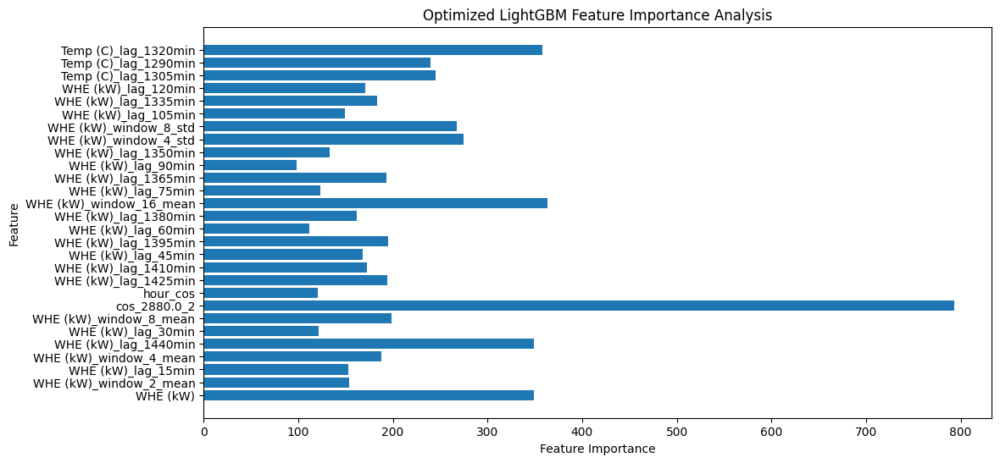

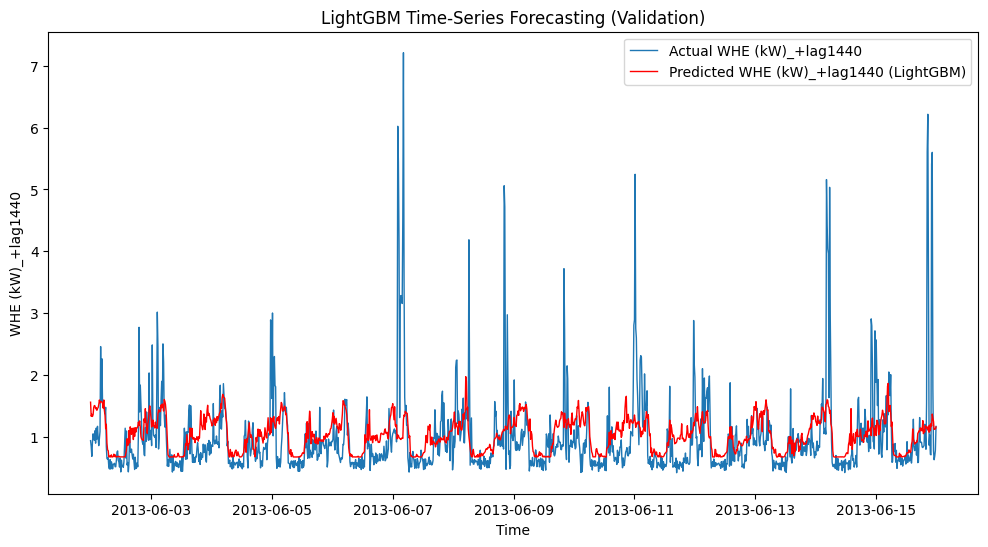

In [ ]:
modelname= 'LightGBM'

# Create output directory if it doesn't exist
output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\LightGBM_03.03_n=100_256"
os.makedirs(output_dir, exist_ok=True)

# Define TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

X_train, y_train = DF_training.drop(columns=['y']), DF_training['y']
X_validation, y_validation = DF_validation.drop(columns=['y']), DF_validation['y']
X_test, y_test = DF_test.drop(columns=['y']), DF_test['y']

# Ensure features are numeric before training
X_train = X_train.select_dtypes(include=[np.number])
X_validation = X_validation.select_dtypes(include=[np.number])
X_test = X_test.select_dtypes(include=[np.number])


def objective(trial):
    num_leaves = trial.suggest_int('num_leaves', 31, 100)
    learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.1)
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    max_depth = trial.suggest_categorical('max_depth', [-1, 10, 20])

    model = lgb.LGBMRegressor(
        num_leaves=num_leaves,
        learning_rate=learning_rate,
        n_estimators=n_estimators,
        max_depth=max_depth,
        random_state=42
    )

    mse_scores = []
    for train_index, val_index in tscv.split(X_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

        model.fit(X_train_fold, y_train_fold)
        y_pred_fold = model.predict(X_val_fold)
        mse_scores.append(mean_squared_error(y_val_fold, y_pred_fold))

    return np.mean(mse_scores)

# Run Optuna optimization
studyLightGBM = optuna.create_study(direction='minimize')
studyLightGBM.optimize(objective, n_trials=100)

# Save best parameters
best_params = studyLightGBM.best_trial.params
best_params_path = os.path.join(output_dir, f"{modelname}_best_params.json")
with open(best_params_path, "w") as f:
    json.dump(best_params, f, indent=4)
print(f"Best parameters saved to {best_params_path}")
print("Best Hyperparameters:", best_params)

# Train the best model using the optimal parameters
best_lgbm_model = lgb.LGBMRegressor(**best_params, random_state=42)
best_lgbm_model.fit(X_train, y_train)

# Predict on validation set
y_pred_validation = best_lgbm_model.predict(X_validation)
mse_validation = mean_squared_error(y_validation, y_pred_validation)
print(f"Mean Squared Error (validation): {mse_validation:.4f}")
y_pred_validation_series = pd.Series(y_pred_validation, index=y_validation.index, name="Predicted")

# Save final predictions
y_pred_validation_path = os.path.join(output_dir, f"{modelname}_final_predictions.csv")
y_pred_validation_series.to_csv(y_pred_validation_path)
print(f"Final predictions saved to {y_pred_validation_path}")

# Feature Importance Analysis
feature_importances = best_lgbm_model.feature_importances_
plt.figure(figsize=(12, 6))
plt.barh(X_train.columns, feature_importances, align='center')
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Optimized LightGBM Feature Importance Analysis")
plt.show()

# Plot Actual vs. Predicted Values
plt.figure(figsize=(12, 6))
plt.plot(y_validation.index, y_validation, label="Actual WHE (kW)_+lag1440", linewidth=1)
plt.plot(y_validation.index, y_pred_validation, label="Predicted WHE (kW)_+lag1440 (LightGBM)", color='red', linewidth=1)
plt.legend()
plt.xlabel("Time")
plt.ylabel("WHE (kW)_+lag1440")
plt.title("LightGBM Time-Series Forecasting (Validation)")
plt.show()


## XGBoost

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
import xgboost as xgb
import optuna
from sklearn.metrics import mean_squared_error
import os
import json
import sys

[I 2025-03-03 20:11:27,471] A new study created in memory with name: no-name-0f5e64ae-6139-411d-9e6f-9838b4de8055


C:\Users\gkeep\AppData\Local\Temp\ipykernel_33276\2851631982.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 0.01, 0.2)
[I 2025-03-03 20:11:39,464] Trial 0 finished with value: 0.7453491996259498 and parameters: {'max_depth': 4, 'n_estimators': 1500, 'learning_rate': 0.053371570528267534, 'subsample': 0.8, 'colsample_bytree': 1.0}. Best is trial 0 with value: 0.7453491996259498.
C:\Users\gkeep\AppData\Local\Temp\ipykernel_33276\2851631982.py:23: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 0.01, 0.2)
[I 2025-03-03 20:11:55,483] Trial 1 finished with 

Best parameters saved to C:\Users\gkeep\Desktop\Results\DNN\XGBoost_03.03_n=100\XGBoost_best_params.json
Best Hyperparameters: {'max_depth': 3, 'n_estimators': 300, 'learning_rate': 0.013084191163526724, 'subsample': 1.0, 'colsample_bytree': 0.7}
Mean Squared Error (validation): 0.3891
Final predictions saved to C:\Users\gkeep\Desktop\Results\DNN\XGBoost_03.03_n=100\XGBoost_final_predictions.csv


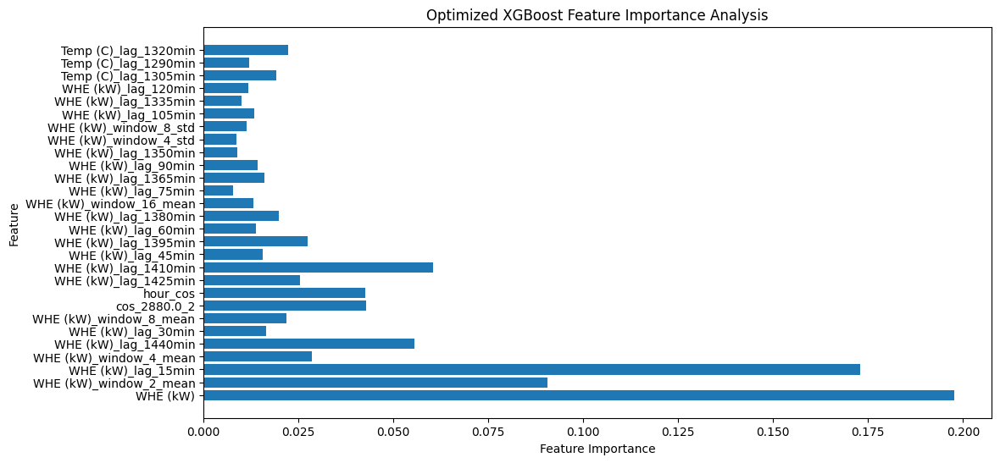

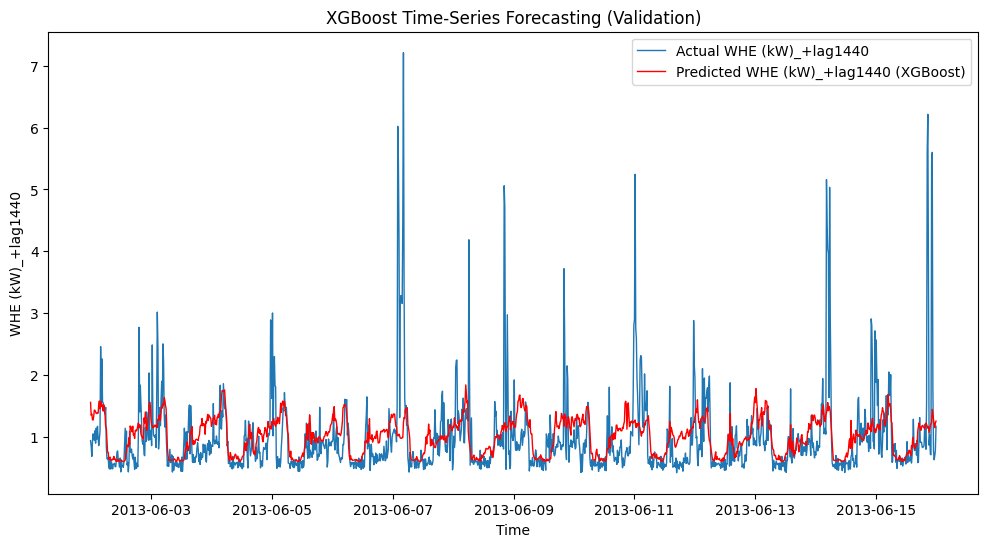

In [ ]:
modelname= 'XGBoost'

# Create output directory if it doesn't exist
output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\XGBoost_03.03_n=100"
os.makedirs(output_dir, exist_ok=True)

# Define TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

X_train, y_train = DF_training.drop(columns=['y']), DF_training['y']
X_validation, y_validation = DF_validation.drop(columns=['y']), DF_validation['y']
X_test, y_test = DF_test.drop(columns=['y']), DF_test['y']

# Ensure features are numeric before training
X_train = X_train.select_dtypes(include=[np.number])
X_validation = X_validation.select_dtypes(include=[np.number])
X_test = X_test.select_dtypes(include=[np.number])


def objective(trial):
    max_depth = trial.suggest_int("max_depth", 3, 10)
    n_estimators =  trial.suggest_int("n_estimators", 100, 2000, step=100)
    learning_rate = trial.suggest_loguniform("learning_rate", 0.01, 0.2)
    subsample = trial.suggest_categorical("subsample", [0.7, 0.8, 1.0])
    colsample_bytree = trial.suggest_categorical("colsample_bytree", [0.7, 0.8, 1.0])

    model = xgb.XGBRegressor(
        max_depth = max_depth,
        n_estimators = n_estimators,
        learning_rate = learning_rate,
        subsample = subsample,
        colsample_bytree = colsample_bytree,
        random_state=42,
        n_jobs=-1
    )

    mse_scores = []
    for train_index, val_index in tscv.split(X_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

        model.fit(X_train_fold, y_train_fold)
        y_pred_fold = model.predict(X_val_fold)
        mse_scores.append(mean_squared_error(y_val_fold, y_pred_fold))

    return np.mean(mse_scores)

# Run Optuna optimization
studyXGBoost = optuna.create_study(direction='minimize')
studyXGBoost.optimize(objective, n_trials=100)

# Save best parameters
best_params = studyXGBoost.best_trial.params
best_params_path = os.path.join(output_dir, f"{modelname}_best_params.json")
with open(best_params_path, "w") as f:
    json.dump(best_params, f, indent=4)
print(f"Best parameters saved to {best_params_path}")
print("Best Hyperparameters:", best_params)

# Train the best model using the optimal parameters
best_xgb_model = xgb.XGBRegressor(**best_params, random_state=42, n_jobs=-1)
best_xgb_model.fit(X_train, y_train)

# Predict on validation set
y_pred_validation = best_xgb_model.predict(X_validation)
mse_validation = mean_squared_error(y_validation, y_pred_validation)
print(f"Mean Squared Error (validation): {mse_validation:.4f}")
y_pred_validation_series = pd.Series(y_pred_validation, index=y_validation.index, name="Predicted")

# Save final predictions
y_pred_validation_path = os.path.join(output_dir, f"{modelname}_final_predictions.csv")
y_pred_validation_series.to_csv(y_pred_validation_path)
print(f"Final predictions saved to {y_pred_validation_path}")

# Feature Importance Analysis
feature_importances = best_xgb_model.feature_importances_
plt.figure(figsize=(12, 6))
plt.barh(X_train.columns, feature_importances, align='center')
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Optimized XGBoost Feature Importance Analysis")
plt.show()

# Plot Actual vs. Predicted Values
plt.figure(figsize=(12, 6))
plt.plot(y_validation.index, y_validation, label="Actual WHE (kW)_+lag1440", linewidth=1)
plt.plot(y_validation.index, y_pred_validation, label="Predicted WHE (kW)_+lag1440 (XGBoost)", color='red', linewidth=1)
plt.legend()
plt.xlabel("Time")
plt.ylabel("WHE (kW)_+lag1440")
plt.title("XGBoost Time-Series Forecasting (Validation)")
plt.show()


## RandomForest

In [ ]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

[I 2025-03-05 16:48:48,135] A new study created in memory with name: no-name-72128ffa-7ac7-4426-bbc7-e72f3e81f244


[I 2025-03-05 16:49:45,122] Trial 0 finished with value: 0.6828038253559614 and parameters: {'max_depth': 10, 'n_estimators': 400, 'min_samples_split': 9, 'min_samples_leaf': 4, 'bootstrap': True}. Best is trial 0 with value: 0.6828038253559614.
[I 2025-03-05 16:52:53,340] Trial 1 finished with value: 0.6911375428010286 and parameters: {'max_depth': 20, 'n_estimators': 900, 'min_samples_split': 7, 'min_samples_leaf': 4, 'bootstrap': True}. Best is trial 0 with value: 0.6828038253559614.
[I 2025-03-05 16:56:15,528] Trial 2 finished with value: 1.1205575270209096 and parameters: {'max_depth': 30, 'n_estimators': 600, 'min_samples_split': 3, 'min_samples_leaf': 4, 'bootstrap': False}. Best is trial 0 with value: 0.6828038253559614.
[I 2025-03-05 16:57:01,054] Trial 3 finished with value: 0.7005927147289867 and parameters: {'max_depth': 20, 'n_estimators': 200, 'min_samples_split': 7, 'min_samples_leaf': 3, 'bootstrap': True}. Best is trial 0 with value: 0.6828038253559614.
[I 2025-03-05 1

Best parameters saved to C:\Users\gkeep\Desktop\Results\DNN\RandomForest_05.03_n=100\RandomForest_best_params.json
Best Hyperparameters: {'max_depth': 10, 'n_estimators': 800, 'min_samples_split': 3, 'min_samples_leaf': 4, 'bootstrap': True}
Mean Squared Error (validation): 0.4004
Final predictions saved to C:\Users\gkeep\Desktop\Results\DNN\RandomForest_05.03_n=100\RandomForest_final_predictions.csv


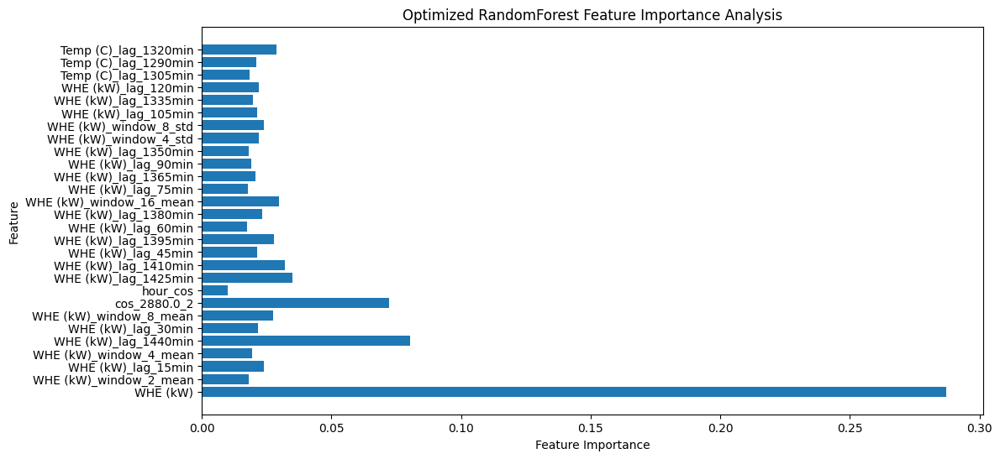

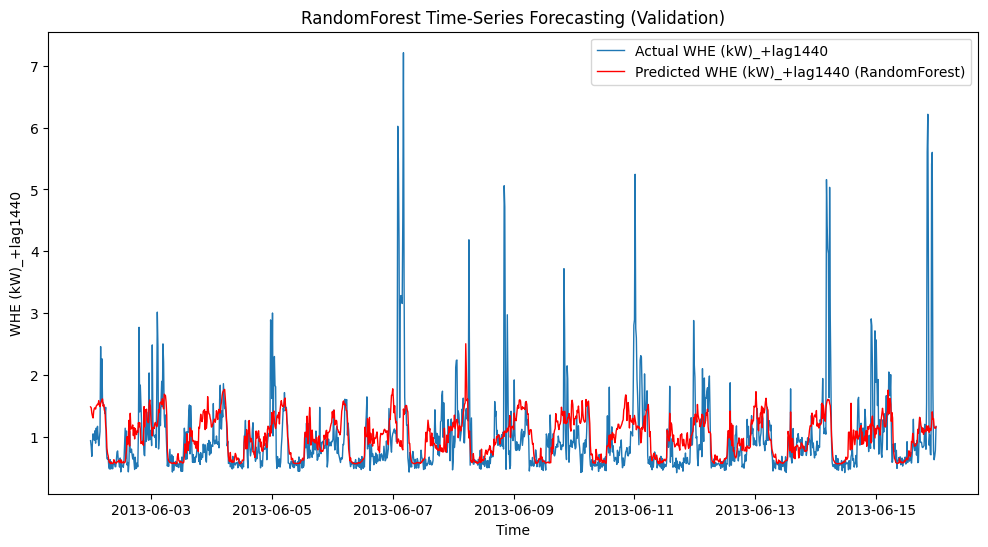

In [ ]:
modelname= 'RandomForest'

# Create output directory if it doesn't exist
output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\RandomForest_05.03_n=100"
os.makedirs(output_dir, exist_ok=True)

# Define TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

X_train, y_train = DF_training.drop(columns=['y']), DF_training['y']
X_validation, y_validation = DF_validation.drop(columns=['y']), DF_validation['y']
X_test, y_test = DF_test.drop(columns=['y']), DF_test['y']

# Ensure features are numeric before training
X_train = X_train.select_dtypes(include=[np.number])
X_validation = X_validation.select_dtypes(include=[np.number])
X_test = X_test.select_dtypes(include=[np.number])


def objective(trial):
    max_depth = trial.suggest_categorical('max_depth', [10, 20, 30])
    n_estimators =  trial.suggest_int("n_estimators", 100, 1000, step=100)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 10)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 4)
    bootstrap = trial.suggest_categorical("bootstrap", [True, False])


    model = RandomForestRegressor(
        max_depth = max_depth,
        n_estimators = n_estimators,
        min_samples_split = min_samples_split,
        min_samples_leaf = min_samples_leaf,
        bootstrap = bootstrap,
        random_state=42,
        n_jobs=-1
    )

    mse_scores = []
    for train_index, val_index in tscv.split(X_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

        model.fit(X_train_fold, y_train_fold)
        y_pred_fold = model.predict(X_val_fold)
        mse_scores.append(mean_squared_error(y_val_fold, y_pred_fold))

    return np.mean(mse_scores)

# Run Optuna optimization
studyRandomForest = optuna.create_study(direction='minimize')
studyRandomForest.optimize(objective, n_trials=100)

# Save best parameters
best_params = studyRandomForest.best_trial.params
best_params_path = os.path.join(output_dir, f"{modelname}_best_params.json")
with open(best_params_path, "w") as f:
    json.dump(best_params, f, indent=4)
print(f"Best parameters saved to {best_params_path}")
print("Best Hyperparameters:", best_params)

# Train the best model using the optimal parameters
best_rf_model = RandomForestRegressor(**best_params, random_state=42, n_jobs=-1)
best_rf_model.fit(X_train, y_train)

# Predict on validation set
y_pred_validation = best_rf_model.predict(X_validation)
mse_validation = mean_squared_error(y_validation, y_pred_validation)
print(f"Mean Squared Error (validation): {mse_validation:.4f}")
y_pred_validation_series = pd.Series(y_pred_validation, index=y_validation.index, name="Predicted")

# Save final predictions
y_pred_validation_path = os.path.join(output_dir, f"{modelname}_final_predictions.csv")
y_pred_validation_series.to_csv(y_pred_validation_path)
print(f"Final predictions saved to {y_pred_validation_path}")

# Feature Importance Analysis
feature_importances = best_rf_model.feature_importances_
plt.figure(figsize=(12, 6))
plt.barh(X_train.columns, feature_importances, align='center')
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Optimized RandomForest Feature Importance Analysis")
plt.show()

# Plot Actual vs. Predicted Values
plt.figure(figsize=(12, 6))
plt.plot(y_validation.index, y_validation, label="Actual WHE (kW)_+lag1440", linewidth=1)
plt.plot(y_validation.index, y_pred_validation, label="Predicted WHE (kW)_+lag1440 (RandomForest)", color='red', linewidth=1)
plt.legend()
plt.xlabel("Time")
plt.ylabel("WHE (kW)_+lag1440")
plt.title("RandomForest Time-Series Forecasting (Validation)")
plt.show()


# Test

## TCN

In [ ]:
prediction_horizon_steps=96
fixed_training_size=15840

# Prepare final predictions DataFrame
final_all_preds = pd.DataFrame()
total_rows = len(df_scaled)

# Compute number of iterations for the sliding window
num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps
print(f"Total iterations for forecasting: {num_iterations}")

Total iterations for forecasting: 14


In [ ]:
i=0
start_train_idx = i * prediction_horizon_steps

end_train_idx = start_train_idx + fixed_training_size
print(start_train_idx,end_train_idx)


0 15840


Seed set to 1
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Loaded Best Parameters from C:\Users\gkeep\Desktop\Results\DNN\TCN_28.02_n=100_256\TCN_best_params.json: {'learning_rate': 1.9955065582827076e-05, 'batch_size': 64, 'kernel_size': 5, 'dilations': [1, 2, 4, 8, 16], 'encoder_hidden_size': 256, 'decoder_hidden_size': 128, 'decoder_layers': 1}
Total iterations for forecasting: 14


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.41it/s, v_num=10831, train_loss_step=2.560, train_loss_epoch=2.560, valid_loss=0.0265]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.11it/s, v_num=10831, train_loss_step=2.560, train_loss_epoch=2.560, valid_loss=0.0265]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.54it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.97it/s, v_num=10833, train_loss_step=2.150, train_loss_epoch=2.150, valid_loss=0.00568]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.60it/s, v_num=10833, train_loss_step=2.150, train_loss_epoch=2.150, valid_loss=0.00568]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.84it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.57it/s, v_num=10835, train_loss_step=2.820, train_loss_epoch=2.820, valid_loss=0.00449]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.31it/s, v_num=10835, train_loss_step=2.820, train_loss_epoch=2.820, valid_loss=0.00449]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 16.35it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.01it/s, v_num=10837, train_loss_step=3.040, train_loss_epoch=3.040, valid_loss=0.00227]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.66it/s, v_num=10837, train_loss_step=3.040, train_loss_epoch=3.040, valid_loss=0.00227]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.81it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.26it/s, v_num=10839, train_loss_step=3.280, train_loss_epoch=3.280, valid_loss=0.0155]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.91it/s, v_num=10839, train_loss_step=3.280, train_loss_epoch=3.280, valid_loss=0.0155]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.84it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.29it/s, v_num=10841, train_loss_step=3.090, train_loss_epoch=3.090, valid_loss=0.00307]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.89it/s, v_num=10841, train_loss_step=3.090, train_loss_epoch=3.090, valid_loss=0.00307]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 16.30it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.30it/s, v_num=10843, train_loss_step=4.150, train_loss_epoch=4.150, valid_loss=0.00183]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.05it/s, v_num=10843, train_loss_step=4.150, train_loss_epoch=4.150, valid_loss=0.00183]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.97it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.87it/s, v_num=10845, train_loss_step=4.300, train_loss_epoch=4.300, valid_loss=0.00638]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.50it/s, v_num=10845, train_loss_step=4.300, train_loss_epoch=4.300, valid_loss=0.00638]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.00it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.85it/s, v_num=10847, train_loss_step=4.130, train_loss_epoch=4.130, valid_loss=0.00592]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.32it/s, v_num=10847, train_loss_step=4.130, train_loss_epoch=4.130, valid_loss=0.00592]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.70it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.93it/s, v_num=10849, train_loss_step=3.660, train_loss_epoch=3.660, valid_loss=0.00258]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.58it/s, v_num=10849, train_loss_step=3.660, train_loss_epoch=3.660, valid_loss=0.00258]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.11it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.26it/s, v_num=10851, train_loss_step=4.110, train_loss_epoch=4.110, valid_loss=0.00429]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.88it/s, v_num=10851, train_loss_step=4.110, train_loss_epoch=4.110, valid_loss=0.00429]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.83it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.63it/s, v_num=10853, train_loss_step=4.100, train_loss_epoch=4.100, valid_loss=0.0017] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.30it/s, v_num=10853, train_loss_step=4.100, train_loss_epoch=4.100, valid_loss=0.0017]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.66it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.32it/s, v_num=10855, train_loss_step=4.500, train_loss_epoch=4.500, valid_loss=0.0138]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.87it/s, v_num=10855, train_loss_step=4.500, train_loss_epoch=4.500, valid_loss=0.0138]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 11.74it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                       | Params | Mode 
-----------------------------------------------------------------------
0 | loss            | MSE                        | 0      | train
1 | padder          | ConstantPad1d              | 0      | train
2 | scaler          | TemporalNorm               | 0      | train
3 | hist_encoder    | TemporalConvolutionEncoder | 1.3 M  | train
4 | context_adapter | Linear                     | 246 K  | train
5 | mlp_decoder     | MLP                        | 1.5 K  | train
-----------------------------------------------------------------------
1.6 M     Trainable params
0         Non-trainable params
1.6 M     Total params
6.246     Total estimated model params size (MB)
37        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.98it/s, v_num=10857, train_loss_step=3.910, train_loss_epoch=3.910, valid_loss=0.00459]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.74it/s, v_num=10857, train_loss_step=3.910, train_loss_epoch=3.910, valid_loss=0.00459]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.10it/s]
Final predictions saved to C:\Users\gkeep\Desktop\Results\DNN\TEST\TCN_07.03_Test_Results\TCN_final_predictions.csv


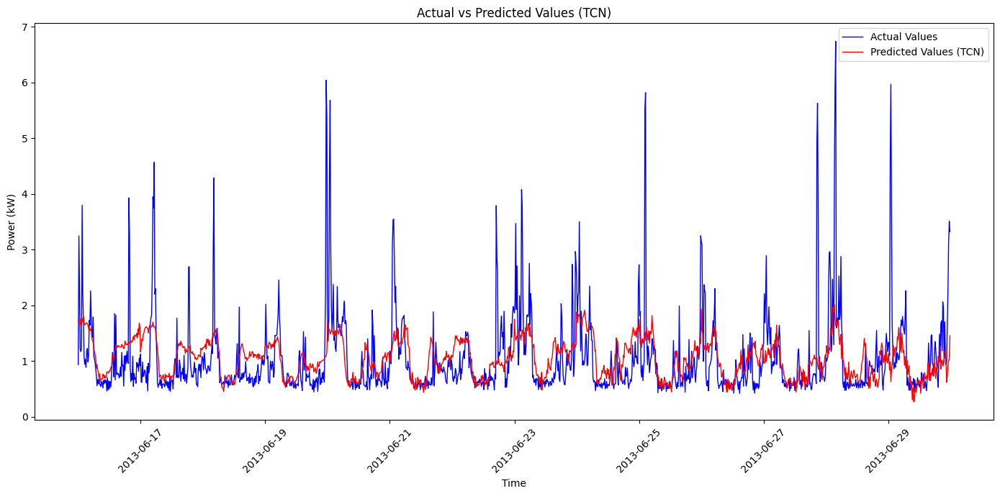

AttributeError: 'float' object has no attribute 'to_csv'

In [ ]:
import time

# Start timing execution
start_time = time.time()

# Model name
modelname = "TCN"

def sliding_window_forecast_TCN_test(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=15840):

    # Split future and past features
    future_features, past_features = separate_future_past_features(features_after_FS1)
    past_features.remove("y")
    mandatory_columns = ["unique_id", "ds", "y"]
    mandatory_columns_future = ["unique_id", "ds"]


    # Paths for saved best parameters (TRAINING OUTPUT PATH)
    training_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TCN_28.02_n=100_256"  # Ensure this is the correct training output directory
    best_params_path = os.path.join(training_output_dir, f"{modelname}_best_params.json")

    # Paths for saving test results (TEST OUTPUT PATH)
    test_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TEST\TCN_07.03_Test_Results"
    os.makedirs(test_output_dir, exist_ok=True)  # Create test output directory

    # Load the best hyperparameters from JSON file
    with open(best_params_path, "r") as f:
        best_params = json.load(f)

    print(f"Loaded Best Parameters from {best_params_path}: {best_params}")

    # Initialize the TCN model using the best hyperparameters
    fcst = NeuralForecast(
        models=[TCN(
            h=prediction_horizon_steps,
            input_size=7 * prediction_horizon_steps,
            kernel_size=best_params['kernel_size'],
            dilations=best_params['dilations'],
            encoder_hidden_size=best_params['encoder_hidden_size'],
            decoder_hidden_size=best_params['decoder_hidden_size'],
            decoder_layers=best_params['decoder_layers'],
            max_steps=1200,
            early_stop_patience_steps=-1,
            val_check_steps=100,
            learning_rate=best_params['learning_rate'],
            loss=MSE(),
            batch_size=best_params['batch_size']
        )],
        freq="15min"
    )

    # Prepare final predictions DataFrame
    final_all_preds = pd.DataFrame()
    total_rows = len(df_scaled)

    # Compute number of iterations for the sliding window
    num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps
    print(f"Total iterations for forecasting: {num_iterations}")

    for i in range(num_iterations):
        start_train_idx = i * prediction_horizon_steps
        end_train_idx = start_train_idx + fixed_training_size
        DF_training_scaled = df_scaled.iloc[start_train_idx:end_train_idx]

        start_val_idx = end_train_idx
        end_val_idx = start_val_idx + prediction_horizon_steps
        DF_validation_scaled = df_scaled.iloc[start_val_idx:end_val_idx]

        # Fit and predict using the best hyperparameters
        fcst.fit(df=DF_training_scaled[future_features + past_features + mandatory_columns], val_size=prediction_horizon_steps)
        preds = fcst.predict(futr_df=DF_validation_scaled[future_features + mandatory_columns_future])

        # Rescale predictions back to original scale
        predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
        predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

        preds[modelname + "_unscaled"] = predictions_original_scale
        final_all_preds = pd.concat([final_all_preds, preds], axis=0)

    # Set index and save final predictions
    final_all_preds.set_index('ds', inplace=True)

    # Save predictions in test output directory
    final_preds_path = os.path.join(test_output_dir, f"{modelname}_final_predictions.csv")
    final_all_preds.to_csv(final_preds_path)
    print(f"Final predictions saved to {final_preds_path}")

    # Plot predictions
    plot_predictions(modelname, DF_test["y"], final_all_preds[modelname + "_unscaled"])

    ErrorCalculator(modelname, DF_validation["y"], final_all_preds[modelname + "_unscaled"])


    return final_all_preds

# Run the test function
final_all_preds_test = sliding_window_forecast_TCN_test(
    modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=15840
)

# Record execution time
end_time = time.time()
time_spent_TCN = end_time - start_time


# Paths for saving test results (TEST OUTPUT PATH)
test_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TEST\TCN_07.03_Test_Results"
os.makedirs(test_output_dir, exist_ok=True)  # Create test output directory

# Save execution time in the test output directory
time_file_path = os.path.join(test_output_dir, f"{modelname}_elapsed_time.csv")
time_spent_TCN.to_csv(time_file_path)
print(f"Final predictions saved to {time_file_path}")


In [ ]:
time_spent_TCN

456.3596706390381

In [ ]:
ErrorCalculator(modelname, DF_test["y"], final_all_preds[modelname + "_unscaled"])


KeyError: 'TCN_unscaled'

In [ ]:
DF_training_validation_scaled

,WHE (kW),WHE (kW)_window_2_mean,WHE (kW)_lag_15min,WHE (kW)_window_4_mean,WHE (kW)_lag_1440min,WHE (kW)_lag_30min,WHE (kW)_window_8_mean,cos_2880.0_2,hour_cos,WHE (kW)_lag_1425min,...,WHE (kW)_window_8_std,WHE (kW)_lag_105min,WHE (kW)_lag_1335min,WHE (kW)_lag_120min,Temp (C)_lag_1305min,Temp (C)_lag_1290min,Temp (C)_lag_1320min,y,unique_id,ds
2013-01-02 00:00:00,0.114592,0.128833,0.175593,0.103601,0.165041,0.062141,0.116582,1.000000,1.000000,0.137004,...,0.113742,0.065661,0.411491,0.037139,0.201642,0.202555,0.200730,0.409756,sc,2013-01-02 00:00:00
2013-01-02 00:15:00,0.202171,0.158880,0.114592,0.125384,0.137004,0.175593,0.136864,0.998929,1.000000,0.123804,...,0.115748,0.047674,0.340500,0.065661,0.202555,0.203467,0.201642,0.151479,sc,2013-01-02 00:15:00
2013-01-02 00:30:00,0.190562,0.174105,0.202171,0.177771,0.123804,0.114592,0.172610,0.995722,1.000000,0.160649,...,0.162117,0.051915,0.453198,0.047674,0.203467,0.204380,0.202555,0.161093,sc,2013-01-02 00:30:00
2013-01-02 00:45:00,0.213670,0.217624,0.190562,0.222511,0.160649,0.202171,0.210026,0.990393,1.000000,0.317400,...,0.175143,0.052066,0.398231,0.051915,0.204380,0.203467,0.203467,0.161336,sc,2013-01-02 00:45:00
2013-01-02 01:00:00,0.186238,0.224211,0.213670,0.235776,0.317400,0.190562,0.252382,0.982963,0.981372,0.328757,...,0.184190,0.051798,0.187084,0.052066,0.203467,0.202555,0.204380,0.175451,sc,2013-01-02 01:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-06-15 22:45:00,0.067874,0.292625,0.221180,0.296053,0.054832,0.302481,0.279428,0.973465,0.981372,0.064529,...,0.303671,0.046978,0.068418,0.078862,0.580292,0.584854,0.583029,0.048554,sc,2013-06-15 22:45:00
2013-06-15 23:00:00,0.065460,0.158232,0.067874,0.301067,0.064529,0.221180,0.276550,0.982963,1.000000,0.046593,...,0.306275,0.080186,0.048361,0.046978,0.584854,0.589416,0.580292,0.030391,sc,2013-06-15 23:00:00
2013-06-15 23:15:00,0.052343,0.069028,0.065460,0.213479,0.046593,0.067874,0.281390,0.990393,1.000000,0.034104,...,0.300793,0.065837,0.051362,0.080186,0.589416,0.593978,0.584854,0.038052,sc,2013-06-15 23:15:00
2013-06-15 23:30:00,0.292540,0.060131,0.052343,0.126336,0.034104,0.065460,0.274099,0.995722,1.000000,0.046517,...,0.308048,0.053483,0.059500,0.065837,0.593978,0.598540,0.589416,0.049652,sc,2013-06-15 23:30:00


## TSMixersx

Seed set to 1
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Loaded Best Parameters from C:\Users\gkeep\Desktop\Results\DNN\TSMixerx_01.03_n=100_256\TSMixerx_best_params.json: {'dropout': 0.2515484162375713, 'learning_rate': 4.514272267687092e-05, 'batch_size': 32}
Total iterations for forecasting: 14


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.72it/s, v_num=10859, train_loss_step=5.600, train_loss_epoch=5.600, valid_loss=22.20]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.30it/s, v_num=10859, train_loss_step=5.600, train_loss_epoch=5.600, valid_loss=22.20]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 56.79it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Tra

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.54it/s, v_num=10861, train_loss_step=6.350, train_loss_epoch=6.350, valid_loss=7.950]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.49it/s, v_num=10861, train_loss_step=6.350, train_loss_epoch=6.350, valid_loss=7.950]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 58.35it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.43it/s, v_num=10863, train_loss_step=7.870, train_loss_epoch=7.870, valid_loss=10.20]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.02it/s, v_num=10863, train_loss_step=7.870, train_loss_epoch=7.870, valid_loss=10.20]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 64.70it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.59it/s, v_num=10865, train_loss_step=4.760, train_loss_epoch=4.760, valid_loss=5.160]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.26it/s, v_num=10865, train_loss_step=4.760, train_loss_epoch=4.760, valid_loss=5.160]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.16it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.12it/s, v_num=10867, train_loss_step=4.820, train_loss_epoch=4.820, valid_loss=14.10]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.33it/s, v_num=10867, train_loss_step=4.820, train_loss_epoch=4.820, valid_loss=14.10]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 39.47it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.95it/s, v_num=10869, train_loss_step=6.220, train_loss_epoch=6.220, valid_loss=13.30]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.54it/s, v_num=10869, train_loss_step=6.220, train_loss_epoch=6.220, valid_loss=13.30]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 63.64it/s] 

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.38it/s, v_num=10871, train_loss_step=5.720, train_loss_epoch=5.720, valid_loss=6.460]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.90it/s, v_num=10871, train_loss_step=5.720, train_loss_epoch=5.720, valid_loss=6.460]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 83.23it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.41it/s, v_num=10873, train_loss_step=6.430, train_loss_epoch=6.430, valid_loss=10.30]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.96it/s, v_num=10873, train_loss_step=6.430, train_loss_epoch=6.430, valid_loss=10.30]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 63.62it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.24it/s, v_num=10875, train_loss_step=6.150, train_loss_epoch=6.150, valid_loss=13.50]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.53it/s, v_num=10875, train_loss_step=6.150, train_loss_epoch=6.150, valid_loss=13.50]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 78.17it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.38it/s, v_num=10877, train_loss_step=6.620, train_loss_epoch=6.620, valid_loss=5.280]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.87it/s, v_num=10877, train_loss_step=6.620, train_loss_epoch=6.620, valid_loss=5.280]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.39it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.13it/s, v_num=10879, train_loss_step=5.470, train_loss_epoch=5.470, valid_loss=13.70]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.71it/s, v_num=10879, train_loss_step=5.470, train_loss_epoch=5.470, valid_loss=13.70]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.92it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.08it/s, v_num=10881, train_loss_step=6.030, train_loss_epoch=6.030, valid_loss=6.590]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.78it/s, v_num=10881, train_loss_step=6.030, train_loss_epoch=6.030, valid_loss=6.590]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 74.91it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.58it/s, v_num=10883, train_loss_step=6.290, train_loss_epoch=6.290, valid_loss=13.90]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.58it/s, v_num=10883, train_loss_step=6.290, train_loss_epoch=6.290, valid_loss=13.90]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 82.43it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                     | Params | Mode 
-------------------------------------------------------------------------
0 | loss                | MSE                      | 0      | train
1 | padder              | ConstantPad1d            | 0      | train
2 | scaler              | TemporalNorm             | 0      | train
3 | norm                | ReversibleInstanceNorm1d | 2      | train
4 | temporal_projection | Linear                   | 64.6 K | train
5 | feature_mixer_hist  | FeatureMixing            | 3.4 K  | train
6 | first_mixing        | MixingLayer              | 16.0 K | train
7 | mixing_block        | Sequential               | 128 K  | train
8 | out                 | Linear                   | 17     | train
-------------------------------------------------------------------------
212 K     Trainable params
0         Non-trainable params
212 K     Total params
0.848     Total estimated model params size (MB)

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.40it/s, v_num=10885, train_loss_step=5.080, train_loss_epoch=5.080, valid_loss=15.70]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.67it/s, v_num=10885, train_loss_step=5.080, train_loss_epoch=5.080, valid_loss=15.70]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 75.65it/s]
Final predictions saved to C:\Users\gkeep\Desktop\Results\DNN\TEST\TSMixerx_11.03_Test_Results\TSMixerx_final_predictions.csv


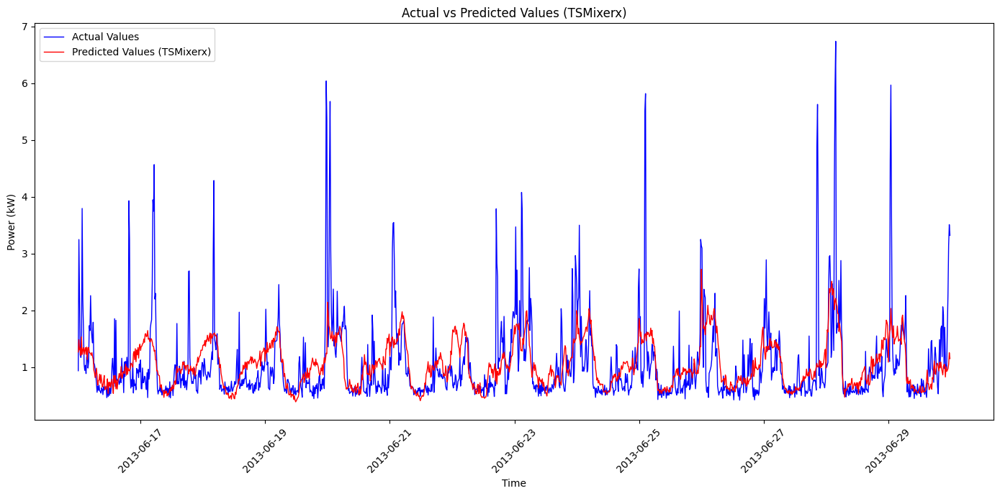

NameError: name 'time_spent_TCN' is not defined

In [ ]:
import time

# Start timing execution
start_time = time.time()

# Model name
modelname = "TSMixerx"

def sliding_window_forecast_TSMixerx_test(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=15840):

    # Paths for saved best parameters (TRAINING OUTPUT PATH)
    training_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TSMixerx_01.03_n=100_256"  # Ensure this is the correct training output directory
    best_params_path = os.path.join(training_output_dir, f"{modelname}_best_params.json")

    # Paths for saving test results (TEST OUTPUT PATH)
    test_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TEST\TSMixerx_11.03_Test_Results"
    os.makedirs(test_output_dir, exist_ok=True)  # Create test output directory

    # Load the best hyperparameters from JSON file
    with open(best_params_path, "r") as f:
        best_params = json.load(f)

    print(f"Loaded Best Parameters from {best_params_path}: {best_params}")

    # Get the best trial parameters and retrain
    fcst = NeuralForecast(
        models=[TSMixerx(
            h=prediction_horizon_steps,
            input_size=7*prediction_horizon_steps,
            n_block=8,
            n_series = DF_training_validation_scaled['unique_id'].nunique(),
            ff_dim=16,
            revin=True,
            scaler_type='robust',
            dropout=best_params['dropout'],
            max_steps=1200,
            early_stop_patience_steps=-1,
            val_check_steps=10,
            learning_rate=best_params['learning_rate'],
            loss=MSE(),
            batch_size=best_params['batch_size']
        )],
        freq="15min"
    )

    # Prepare final predictions DataFrame
    final_all_preds = pd.DataFrame()
    total_rows = len(df_scaled)

    # Compute number of iterations for the sliding window
    num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps
    print(f"Total iterations for forecasting: {num_iterations}")

    for i in range(num_iterations):
        start_train_idx = i * prediction_horizon_steps
        end_train_idx = start_train_idx + fixed_training_size
        DF_training_scaled = df_scaled.iloc[start_train_idx:end_train_idx]

        start_val_idx = end_train_idx
        end_val_idx = start_val_idx + prediction_horizon_steps
        DF_validation_scaled = df_scaled.iloc[start_val_idx:end_val_idx]

        # Fit model and predict
        fcst.fit(df=DF_training_scaled, val_size=prediction_horizon_steps)
        preds = fcst.predict(futr_df=DF_validation_scaled)

        # Rescale predictions back to original scale
        predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
        predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

        preds[modelname + "_unscaled"] = predictions_original_scale
        final_all_preds = pd.concat([final_all_preds, preds], axis=0)

    # Set index and save final predictions
    final_all_preds.set_index('ds', inplace=True)

    # Save predictions in test output directory
    final_preds_path = os.path.join(test_output_dir, f"{modelname}_final_predictions.csv")
    final_all_preds.to_csv(final_preds_path)
    print(f"Final predictions saved to {final_preds_path}")

    # Plot predictions
    plot_predictions(modelname, DF_test["y"], final_all_preds[modelname + "_unscaled"])

    return final_all_preds

# Run the test function
final_all_preds_test = sliding_window_forecast_TSMixerx_test(
    modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=15840
)





## Nbeatsx

Seed set to 1
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Loaded Best Parameters from C:\Users\gkeep\Desktop\Results\DNN\Trial\NBEATSx_15.05_n=100\NBEATSx_best_params.json: {'n_blocks': [3, 1, 1], 'mlp_units': [[96, 96], [96, 96], [96, 96]], 'dropout_prob_theta': 0.2579286672689306, 'learning_rate': 9.178902332309833e-05, 'batch_size': 64}
Total iterations for forecasting: 14


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.75it/s, v_num=28187, train_loss_step=6.280, train_loss_epoch=6.280, valid_loss=0.0176]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.42it/s, v_num=28187, train_loss_step=6.280, train_loss_epoch=6.280, valid_loss=0.0176]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 43.73it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.52it/s, v_num=28189, train_loss_step=6.030, train_loss_epoch=6.030, valid_loss=0.00566]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s, v_num=28189, train_loss_step=6.030, train_loss_epoch=6.030, valid_loss=0.00566]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 70.13it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s, v_num=28191, train_loss_step=5.740, train_loss_epoch=5.740, valid_loss=0.00716]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s, v_num=28191, train_loss_step=5.740, train_loss_epoch=5.740, valid_loss=0.00716]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 79.00it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s, v_num=28193, train_loss_step=5.340, train_loss_epoch=5.340, valid_loss=0.00354]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s, v_num=28193, train_loss_step=5.340, train_loss_epoch=5.340, valid_loss=0.00354]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.70it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  7.01it/s, v_num=28195, train_loss_step=4.950, train_loss_epoch=4.950, valid_loss=0.00875]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.82it/s, v_num=28195, train_loss_step=4.950, train_loss_epoch=4.950, valid_loss=0.00875]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 72.72it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  7.20it/s, v_num=28197, train_loss_step=5.040, train_loss_epoch=5.040, valid_loss=0.00944]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.77it/s, v_num=28197, train_loss_step=5.040, train_loss_epoch=5.040, valid_loss=0.00944]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 69.10it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s, v_num=28199, train_loss_step=4.760, train_loss_epoch=4.760, valid_loss=0.00462]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s, v_num=28199, train_loss_step=4.760, train_loss_epoch=4.760, valid_loss=0.00462]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 101.45it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s, v_num=28201, train_loss_step=4.650, train_loss_epoch=4.650, valid_loss=0.00688]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s, v_num=28201, train_loss_step=4.650, train_loss_epoch=4.650, valid_loss=0.00688]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 87.71it/s] 

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.47it/s, v_num=28203, train_loss_step=4.430, train_loss_epoch=4.430, valid_loss=0.00768]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s, v_num=28203, train_loss_step=4.430, train_loss_epoch=4.430, valid_loss=0.00768]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 67.22it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.41it/s, v_num=28205, train_loss_step=4.700, train_loss_epoch=4.700, valid_loss=0.00321]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s, v_num=28205, train_loss_step=4.700, train_loss_epoch=4.700, valid_loss=0.00321]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 72.05it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.35it/s, v_num=28207, train_loss_step=4.350, train_loss_epoch=4.350, valid_loss=0.00801]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s, v_num=28207, train_loss_step=4.350, train_loss_epoch=4.350, valid_loss=0.00801]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 86.76it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.46it/s, v_num=28209, train_loss_step=4.400, train_loss_epoch=4.400, valid_loss=0.00485]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s, v_num=28209, train_loss_step=4.400, train_loss_epoch=4.400, valid_loss=0.00485]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 61.88it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s, v_num=28211, train_loss_step=4.380, train_loss_epoch=4.380, valid_loss=0.010] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s, v_num=28211, train_loss_step=4.380, train_loss_epoch=4.380, valid_loss=0.010]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 86.21it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 871 K  | train
-------------------------------------------------------
723 K     Trainable params
148 K     Non-trainable params
871 K     Total params
3.487     Total estimated model params size (MB)
64        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s, v_num=28213, train_loss_step=4.470, train_loss_epoch=4.470, valid_loss=0.0102]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s, v_num=28213, train_loss_step=4.470, train_loss_epoch=4.470, valid_loss=0.0102]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.44it/s]
Final predictions saved to C:\Users\gkeep\Desktop\Results\DNN\TEST\NBEATSx_19.05_Test_Results\NBEATSx_final_predictions.csv


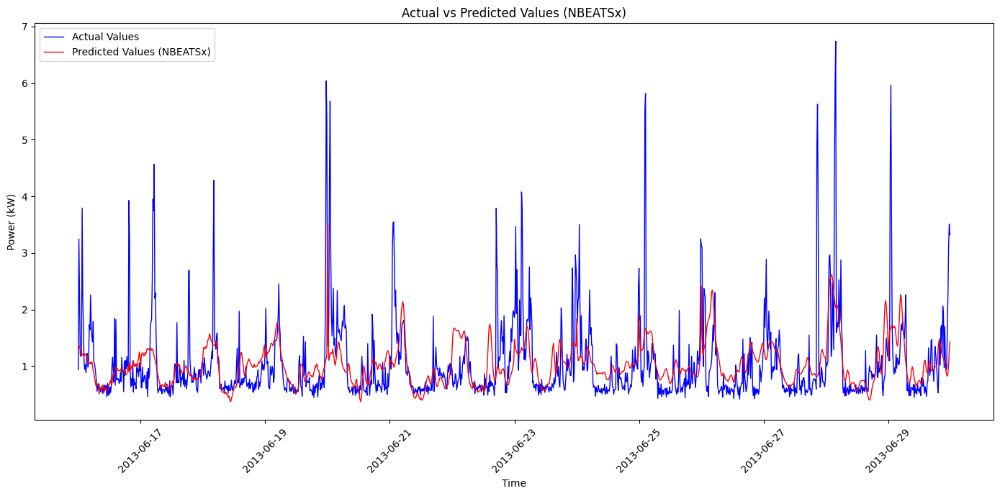

In [22]:
import time

# Start timing execution
start_time = time.time()

# Model name
modelname = "NBEATSx"

def sliding_window_forecast_NBEATSx_test(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=15840):

    # Paths for saved best parameters (TRAINING OUTPUT PATH)
    training_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\Trial\NBEATSx_15.05_n=100"  # Ensure this is the correct training output directory
    best_params_path = os.path.join(training_output_dir, f"{modelname}_best_params.json")

    # Paths for saving test results (TEST OUTPUT PATH)
    test_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TEST\NBEATSx_19.05_Test_Results"
    os.makedirs(test_output_dir, exist_ok=True)  # Create test output directory

    # Load the best hyperparameters from JSON file
    with open(best_params_path, "r") as f:
        best_params = json.load(f)

    print(f"Loaded Best Parameters from {best_params_path}: {best_params}")

    # Get the best trial parameters and retrain
    fcst = NeuralForecast(
        models=[NBEATSx(
            h=prediction_horizon_steps,
            input_size=7*prediction_horizon_steps,
            stack_types=['identity','trend','seasonality'],
            n_blocks=best_params['n_blocks'],
            mlp_units=best_params['mlp_units'],
            loss=MSE(),
            scaler_type='robust',
            dropout_prob_theta=best_params['dropout_prob_theta'],
            max_steps=1200,
            val_check_steps=10,
            early_stop_patience_steps=-1,
            learning_rate=best_params['learning_rate'],
            batch_size=best_params['batch_size']
        )],
        freq="15min"
    )

    # Prepare final predictions DataFrame
    final_all_preds = pd.DataFrame()
    total_rows = len(df_scaled)

    # Compute number of iterations for the sliding window
    num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps
    print(f"Total iterations for forecasting: {num_iterations}")

    for i in range(num_iterations):
        start_train_idx = i * prediction_horizon_steps
        end_train_idx = start_train_idx + fixed_training_size
        DF_training_scaled = df_scaled.iloc[start_train_idx:end_train_idx]

        start_val_idx = end_train_idx
        end_val_idx = start_val_idx + prediction_horizon_steps
        DF_validation_scaled = df_scaled.iloc[start_val_idx:end_val_idx]

        # Fit model and predict
        fcst.fit(df=DF_training_scaled, val_size=prediction_horizon_steps)
        preds = fcst.predict(futr_df=DF_validation_scaled)

        # Rescale predictions back to original scale
        predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
        predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

        preds[modelname + "_unscaled"] = predictions_original_scale
        final_all_preds = pd.concat([final_all_preds, preds], axis=0)

    # Set index and save final predictions
    final_all_preds.set_index('ds', inplace=True)

    # Save predictions in test output directory
    final_preds_path = os.path.join(test_output_dir, f"{modelname}_final_predictions.csv")
    final_all_preds.to_csv(final_preds_path)
    print(f"Final predictions saved to {final_preds_path}")

    # Plot predictions
    plot_predictions(modelname, DF_test["y"], final_all_preds[modelname + "_unscaled"])

    return final_all_preds

# Run the test function
final_all_preds_test = sliding_window_forecast_NBEATSx_test(
    modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=15840
)


In [24]:
ErrorCalculator(modelname, DF_test["y"], final_all_preds_test[modelname + "_unscaled"])


{'Pipelines': 'NBEATSx',
 'RMSE': np.float64(0.6705463062824303),
 'MAE': np.float64(0.3957741975467002),
 'MSE': np.float64(0.4496323488690108),
 'PRMSE': np.float64(2.7347892770954823)}

## LSTM

Seed set to 1
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Loaded Best Parameters from C:\Users\gkeep\Desktop\Results\DNN\LSTM_13.03_n=100\LSTM_best_params.json: {'learning_rate': 0.004191846810794834, 'batch_size': 128, 'hidden_size': 32, 'encoder_n_layers': 1, 'decoder_layers': 2, 'num_lr_decays': 4}
Total iterations for forecasting: 14


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 12.47it/s, v_num=16543, train_loss_step=3.290, train_loss_epoch=3.290, valid_loss=0.0271] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.98it/s, v_num=16543, train_loss_step=3.290, train_loss_epoch=3.290, valid_loss=0.0271]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.32it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.66it/s, v_num=16545, train_loss_step=2.470, train_loss_epoch=2.470, valid_loss=0.00573] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.15it/s, v_num=16545, train_loss_step=2.470, train_loss_epoch=2.470, valid_loss=0.00573]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.98it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 14.29it/s, v_num=16547, train_loss_step=3.340, train_loss_epoch=3.340, valid_loss=0.00539] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 14.29it/s, v_num=16547, train_loss_step=3.340, train_loss_epoch=3.340, valid_loss=0.00539]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.67it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 14.86it/s, v_num=16549, train_loss_step=3.080, train_loss_epoch=3.080, valid_loss=0.00188] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 14.86it/s, v_num=16549, train_loss_step=3.080, train_loss_epoch=3.080, valid_loss=0.00188]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.88it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.21it/s, v_num=16551, train_loss_step=3.290, train_loss_epoch=3.290, valid_loss=0.0152] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.76it/s, v_num=16551, train_loss_step=3.290, train_loss_epoch=3.290, valid_loss=0.0152]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.62it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 10.40it/s, v_num=16553, train_loss_step=3.000, train_loss_epoch=3.000, valid_loss=0.00301]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.98it/s, v_num=16553, train_loss_step=3.000, train_loss_epoch=3.000, valid_loss=0.00301]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  7.99it/s, v_num=16555, train_loss_step=4.110, train_loss_epoch=4.110, valid_loss=0.00128] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  7.56it/s, v_num=16555, train_loss_step=4.110, train_loss_epoch=4.110, valid_loss=0.00128]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.25it/s, v_num=16557, train_loss_step=4.280, train_loss_epoch=4.280, valid_loss=0.00637] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.00it/s, v_num=16557, train_loss_step=4.280, train_loss_epoch=4.280, valid_loss=0.00637]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.35it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 13.11it/s, v_num=16559, train_loss_step=3.960, train_loss_epoch=3.960, valid_loss=0.00613] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 12.00it/s, v_num=16559, train_loss_step=3.960, train_loss_epoch=3.960, valid_loss=0.00613]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.99it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 15.12it/s, v_num=16561, train_loss_step=3.400, train_loss_epoch=3.400, valid_loss=0.00307] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 15.12it/s, v_num=16561, train_loss_step=3.400, train_loss_epoch=3.400, valid_loss=0.00307]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 17.04it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.39it/s, v_num=16563, train_loss_step=4.230, train_loss_epoch=4.230, valid_loss=0.0044]  

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  8.94it/s, v_num=16563, train_loss_step=4.230, train_loss_epoch=4.230, valid_loss=0.0044]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.65it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  9.09it/s, v_num=16565, train_loss_step=4.110, train_loss_epoch=4.110, valid_loss=0.00165] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  8.34it/s, v_num=16565, train_loss_step=4.110, train_loss_epoch=4.110, valid_loss=0.00165]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.69it/s, v_num=16567, train_loss_step=5.400, train_loss_epoch=5.400, valid_loss=0.0153] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.27it/s, v_num=16567, train_loss_step=5.400, train_loss_epoch=5.400, valid_loss=0.0153]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.16it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MSE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 4.5 K  | train
4 | context_adapter | Linear        | 304 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
311 K     Trainable params
0         Non-trainable params
311 K     Total params
1.247     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 12.24it/s, v_num=16569, train_loss_step=3.700, train_loss_epoch=3.700, valid_loss=0.00475] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00, 11.79it/s, v_num=16569, train_loss_step=3.700, train_loss_epoch=3.700, valid_loss=0.00475]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.27it/s]
Final predictions saved to C:\Users\gkeep\Desktop\Results\DNN\TEST\LSTM_14.03_Test_Results\LSTM_final_predictions.csv


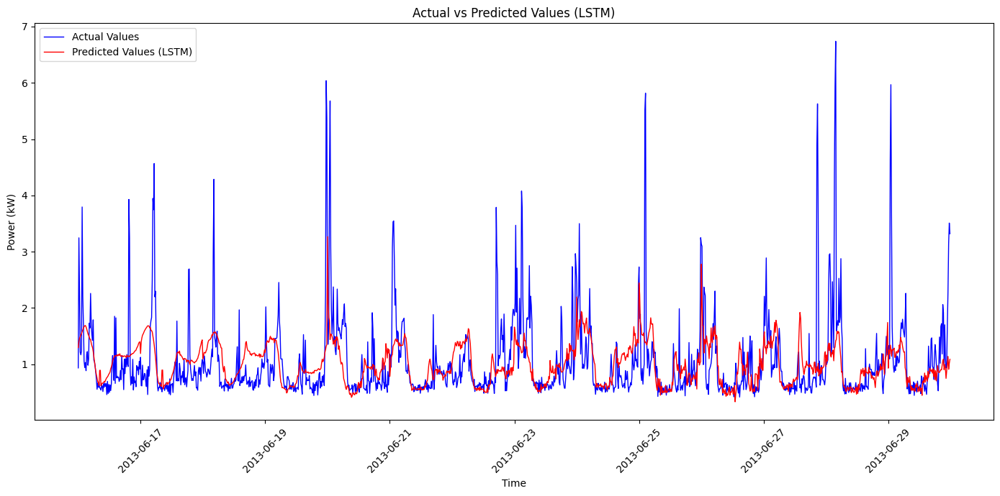

In [ ]:
import time

# Start timing execution
start_time = time.time()

# Model name
modelname = "LSTM"

def sliding_window_forecast_LSTM_test(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=15840):

    # Paths for saved best parameters (TRAINING OUTPUT PATH)
    training_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\LSTM_13.03_n=100"  # Ensure this is the correct training output directory
    best_params_path = os.path.join(training_output_dir, f"{modelname}_best_params.json")

    # Paths for saving test results (TEST OUTPUT PATH)
    test_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TEST\LSTM_14.03_Test_Results"
    os.makedirs(test_output_dir, exist_ok=True)  # Create test output directory

    # Load the best hyperparameters from JSON file
    with open(best_params_path, "r") as f:
        best_params = json.load(f)

    print(f"Loaded Best Parameters from {best_params_path}: {best_params}")

    # Get best parameters and retrain
    fcst = NeuralForecast(
        models=[LSTM(
            h=prediction_horizon_steps,
            input_size=7 * prediction_horizon_steps,
            loss=MSE(),
            scaler_type='robust',
            encoder_n_layers=best_params['encoder_n_layers'],
            encoder_hidden_size=best_params['hidden_size'],
            context_size=prediction_horizon_steps,
            decoder_hidden_size=best_params['hidden_size'],
            decoder_layers=best_params['decoder_layers'],
            max_steps=1200,
            val_check_steps=10,
            early_stop_patience_steps=-1,
            learning_rate=best_params['learning_rate'],
            num_lr_decays=best_params['num_lr_decays'],
            batch_size=best_params['batch_size']
        )],
        freq="15min"
    )

    # Prepare final predictions DataFrame
    final_all_preds = pd.DataFrame()
    total_rows = len(df_scaled)

    # Compute number of iterations for the sliding window
    num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps
    print(f"Total iterations for forecasting: {num_iterations}")

    for i in range(num_iterations):
        start_train_idx = i * prediction_horizon_steps
        end_train_idx = start_train_idx + fixed_training_size
        DF_training_scaled = df_scaled.iloc[start_train_idx:end_train_idx]

        start_val_idx = end_train_idx
        end_val_idx = start_val_idx + prediction_horizon_steps
        DF_validation_scaled = df_scaled.iloc[start_val_idx:end_val_idx]

        # Fit model and predict
        fcst.fit(df=DF_training_scaled, val_size=prediction_horizon_steps)
        preds = fcst.predict(futr_df=DF_validation_scaled)

        # Rescale predictions back to original scale
        predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
        predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

        preds[modelname + "_unscaled"] = predictions_original_scale
        final_all_preds = pd.concat([final_all_preds, preds], axis=0)

    # Set index and save final predictions
    final_all_preds.set_index('ds', inplace=True)

    # Save predictions in test output directory
    final_preds_path = os.path.join(test_output_dir, f"{modelname}_final_predictions.csv")
    final_all_preds.to_csv(final_preds_path)
    print(f"Final predictions saved to {final_preds_path}")

    # Plot predictions
    plot_predictions(modelname, DF_test["y"], final_all_preds[modelname + "_unscaled"])

    return final_all_preds

# Run the test function
final_all_preds_test = sliding_window_forecast_LSTM_test(
    modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=15840
)


## KAN

Seed set to 1
GPU available: True (cuda), used: True


Loaded Best Parameters from C:\Users\gkeep\Desktop\Results\DNN\KAN_11.03_n=100\KAN_best_params.json: {'hidden_size': 96, 'grid_size': 5, 'spline_order': 2, 'n_hidden_layers': 1, 'learning_rate': 3.552409868086595e-05, 'batch_size': 32}
Total iterations for forecasting: 14


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.80it/s, v_num=16571, train_loss_step=0.00984, train_loss_epoch=0.00984, valid_loss=0.0162]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.55it/s, v_num=16571, train_loss_step=0.00984, train_loss_epoch=0.00984, valid_loss=0.0162]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.84it/s] 

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.46it/s, v_num=16573, train_loss_step=0.00978, train_loss_epoch=0.00978, valid_loss=0.00535]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s, v_num=16573, train_loss_step=0.00978, train_loss_epoch=0.00978, valid_loss=0.00535]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 81.59it/s] 

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s, v_num=16575, train_loss_step=0.00941, train_loss_epoch=0.00941, valid_loss=0.00672]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s, v_num=16575, train_loss_step=0.00941, train_loss_epoch=0.00941, valid_loss=0.00672]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 83.35it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.67it/s, v_num=16577, train_loss_step=0.00909, train_loss_epoch=0.00909, valid_loss=0.00323]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.43it/s, v_num=16577, train_loss_step=0.00909, train_loss_epoch=0.00909, valid_loss=0.00323]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 90.89it/s] 

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.56it/s, v_num=16579, train_loss_step=0.009, train_loss_epoch=0.009, valid_loss=0.0085]     

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.37it/s, v_num=16579, train_loss_step=0.009, train_loss_epoch=0.009, valid_loss=0.0085]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 93.71it/s] 

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.46it/s, v_num=16581, train_loss_step=0.00884, train_loss_epoch=0.00884, valid_loss=0.00739]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s, v_num=16581, train_loss_step=0.00884, train_loss_epoch=0.00884, valid_loss=0.00739]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 74.25it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.61it/s, v_num=16583, train_loss_step=0.00875, train_loss_epoch=0.00875, valid_loss=0.00456]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.45it/s, v_num=16583, train_loss_step=0.00875, train_loss_epoch=0.00875, valid_loss=0.00456]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 92.63it/s] 

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.57it/s, v_num=16585, train_loss_step=0.00845, train_loss_epoch=0.00845, valid_loss=0.0063] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.42it/s, v_num=16585, train_loss_step=0.00845, train_loss_epoch=0.00845, valid_loss=0.0063]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 113.41it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.63it/s, v_num=16587, train_loss_step=0.00818, train_loss_epoch=0.00818, valid_loss=0.00784]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.48it/s, v_num=16587, train_loss_step=0.00818, train_loss_epoch=0.00818, valid_loss=0.00784]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 103.41it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.64it/s, v_num=16589, train_loss_step=0.00869, train_loss_epoch=0.00869, valid_loss=0.00349]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.60it/s, v_num=16589, train_loss_step=0.00869, train_loss_epoch=0.00869, valid_loss=0.00349]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 145.89it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.86it/s, v_num=16591, train_loss_step=0.00789, train_loss_epoch=0.00789, valid_loss=0.00931]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.67it/s, v_num=16591, train_loss_step=0.00789, train_loss_epoch=0.00789, valid_loss=0.00931]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 165.27it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.57it/s, v_num=16593, train_loss_step=0.008, train_loss_epoch=0.008, valid_loss=0.00373]    

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.41it/s, v_num=16593, train_loss_step=0.008, train_loss_epoch=0.008, valid_loss=0.00373]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 78.52it/s] 

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s, v_num=16595, train_loss_step=0.00788, train_loss_epoch=0.00788, valid_loss=0.0096] 

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s, v_num=16595, train_loss_step=0.00788, train_loss_epoch=0.00788, valid_loss=0.0096]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 106.01it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MSE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | layers       | ModuleList    | 663 K  | train
-------------------------------------------------------
663 K     Trainable params
0         Non-trainable params
663 K     Total params
2.654     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.54it/s, v_num=16597, train_loss_step=0.00804, train_loss_epoch=0.00804, valid_loss=0.0103]

`Trainer.fit` stopped: `max_steps=1200` reached.


Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  6.37it/s, v_num=16597, train_loss_step=0.00804, train_loss_epoch=0.00804, valid_loss=0.0103]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 119.24it/s]
Final predictions saved to C:\Users\gkeep\Desktop\Results\DNN\TEST\KAN_14.03_Test_Results\KAN_final_predictions.csv


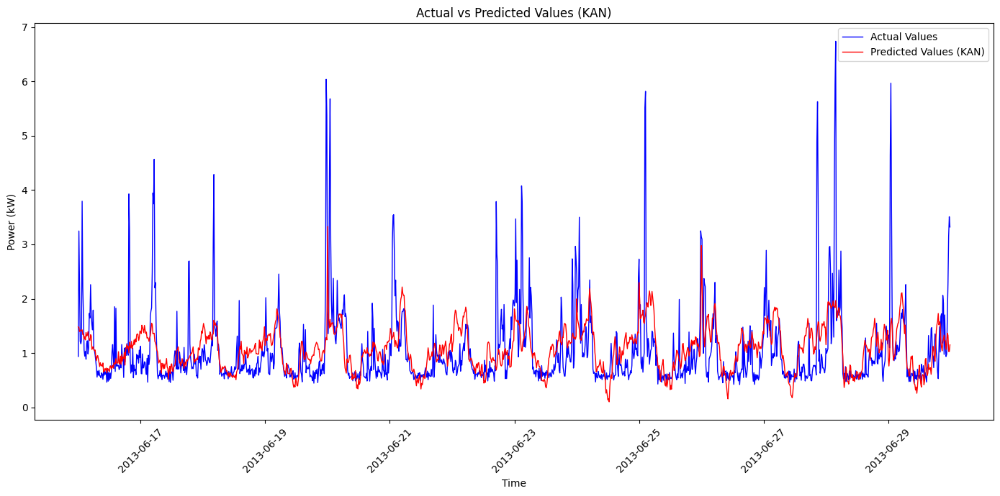

In [ ]:
import time

# Start timing execution
start_time = time.time()

# Model name
modelname = "KAN"

def sliding_window_forecast_KAN_test(modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=15840):

    # Paths for saved best parameters (TRAINING OUTPUT PATH)
    training_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\KAN_11.03_n=100"  # Ensure this is the correct training output directory
    best_params_path = os.path.join(training_output_dir, f"{modelname}_best_params.json")

    # Paths for saving test results (TEST OUTPUT PATH)
    test_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TEST\KAN_14.03_Test_Results"
    os.makedirs(test_output_dir, exist_ok=True)  # Create test output directory

    # Load the best hyperparameters from JSON file
    with open(best_params_path, "r") as f:
        best_params = json.load(f)

    print(f"Loaded Best Parameters from {best_params_path}: {best_params}")

    # Get the best trial parameters and retrain
    fcst = NeuralForecast(
        models=[KAN(
            h=prediction_horizon_steps,
            input_size=7 * prediction_horizon_steps,
            hidden_size=best_params['hidden_size'],
            grid_size=best_params['grid_size'],
            spline_order=best_params['spline_order'],
            n_hidden_layers=best_params['n_hidden_layers'],
            learning_rate=best_params['learning_rate'],
            batch_size=best_params['batch_size'],
            max_steps=1200,
            val_check_steps=10,
            loss=MSE(),
        )],
        freq='15min'
    )

    # Prepare final predictions DataFrame
    final_all_preds = pd.DataFrame()
    total_rows = len(df_scaled)

    # Compute number of iterations for the sliding window
    num_iterations = (total_rows - fixed_training_size) // prediction_horizon_steps
    print(f"Total iterations for forecasting: {num_iterations}")

    for i in range(num_iterations):
        start_train_idx = i * prediction_horizon_steps
        end_train_idx = start_train_idx + fixed_training_size
        DF_training_scaled = df_scaled.iloc[start_train_idx:end_train_idx]

        start_val_idx = end_train_idx
        end_val_idx = start_val_idx + prediction_horizon_steps
        DF_validation_scaled = df_scaled.iloc[start_val_idx:end_val_idx]

        # Fit model and predict
        fcst.fit(df=DF_training_scaled, val_size=prediction_horizon_steps)
        preds = fcst.predict(futr_df=DF_validation_scaled)

        # Rescale predictions back to original scale
        predictions_reshaped = preds[modelname].to_numpy().reshape(-1, 1)
        predictions_original_scale = scaler_target.inverse_transform(predictions_reshaped).flatten()

        preds[modelname + "_unscaled"] = predictions_original_scale
        final_all_preds = pd.concat([final_all_preds, preds], axis=0)

    # Set index and save final predictions
    final_all_preds.set_index('ds', inplace=True)

    # Save predictions in test output directory
    final_preds_path = os.path.join(test_output_dir, f"{modelname}_final_predictions.csv")
    final_all_preds.to_csv(final_preds_path)
    print(f"Final predictions saved to {final_preds_path}")

    # Plot predictions
    plot_predictions(modelname, DF_test["y"], final_all_preds[modelname + "_unscaled"])

    return final_all_preds

# Run the test function
final_all_preds_test = sliding_window_forecast_KAN_test(
    modelname, features_after_FS1, DF_training_validation_scaled, scaler_target, prediction_horizon_steps=96, fixed_training_size=15840
)


## LightGBM

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
import lightgbm as lgb
import optuna
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import os
import json
import sys

Loaded Best Parameters from C:\Users\gkeep\Desktop\Results\DNN\LightGBM_03.03_n=100_256\LightGBM_best_params.json: {'num_leaves': 32, 'learning_rate': 0.012688420331091297, 'n_estimators': 201, 'max_depth': 10}
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 15840, number of used features: 28
[LightGBM] [Info] Start training from score 1.198954
Mean Squared Error (test): 0.4382
Final predictions saved to C:\Users\gkeep\Desktop\Results\DNN\TEST\LightGBM_14.03_Test_Results\LightGBM_final_predictions.csv


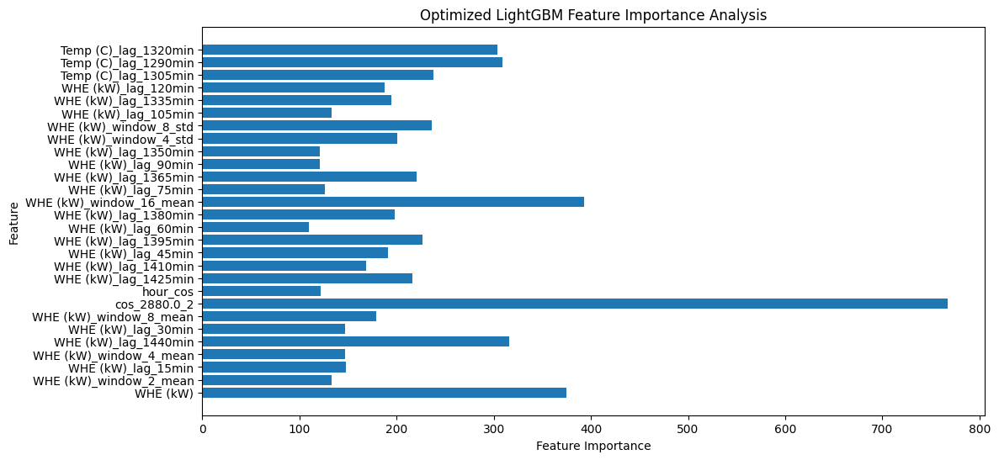

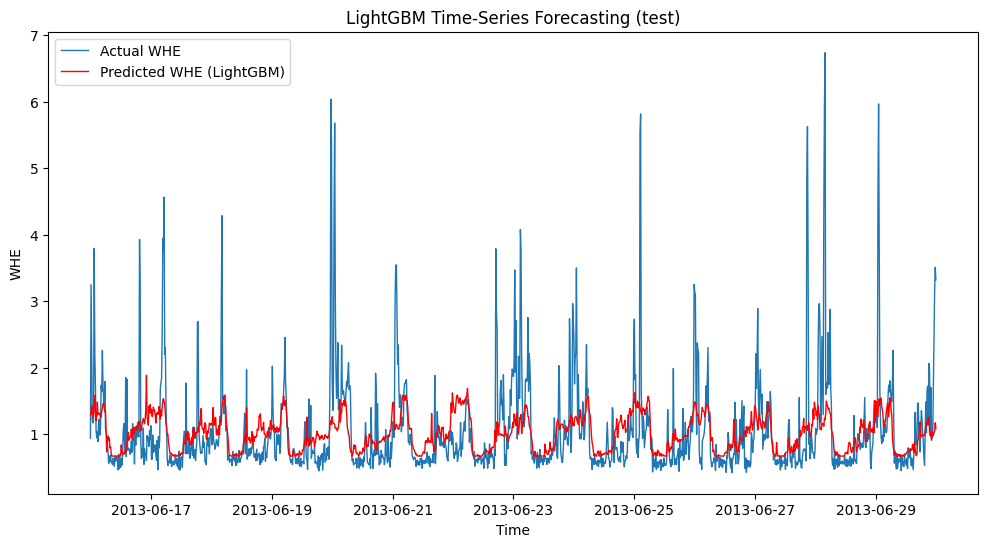

In [ ]:
modelname= 'LightGBM'

# Paths for saved best parameters (TRAINING OUTPUT PATH)
training_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\LightGBM_03.03_n=100_256"  # Ensure this is the correct training output directory
best_params_path = os.path.join(training_output_dir, f"{modelname}_best_params.json")

# Paths for saving test results (TEST OUTPUT PATH)
test_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TEST\LightGBM_14.03_Test_Results"
os.makedirs(test_output_dir, exist_ok=True)  # Create test output directory

# Load the best hyperparameters from JSON file
with open(best_params_path, "r") as f:
    best_params = json.load(f)

print(f"Loaded Best Parameters from {best_params_path}: {best_params}")

# Define TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

X_train, y_train = DF_training.drop(columns=['y']), DF_training['y']
X_validation, y_validation = DF_validation.drop(columns=['y']), DF_validation['y']
X_test, y_test = DF_test.drop(columns=['y']), DF_test['y']
X_train_validation, y_train_validation = pd.concat([X_train, X_validation], ignore_index=True) , pd.concat([y_train, y_validation], ignore_index=True)

# Ensure features are numeric before training
X_train = X_train.select_dtypes(include=[np.number])
X_validation = X_validation.select_dtypes(include=[np.number])
X_test = X_test.select_dtypes(include=[np.number])
X_train_validation = X_train_validation.select_dtypes(include=[np.number])

# Train the best model using the optimal parameters
best_lgbm_model = lgb.LGBMRegressor(**best_params, random_state=42)
best_lgbm_model.fit(X_train_validation, y_train_validation)

# Predict on validation set
y_pred_test = best_lgbm_model.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred_test)
print(f"Mean Squared Error (test): {mse_test:.4f}")
y_pred_test_series = pd.Series(y_pred_test, index=y_test.index, name="Predicted")

# Save final predictions
y_pred_test_path = os.path.join(test_output_dir, f"{modelname}_final_predictions.csv")
y_pred_test_series.to_csv(y_pred_test_path)
print(f"Final predictions saved to {y_pred_test_path}")

# Feature Importance Analysis
feature_importances = best_lgbm_model.feature_importances_
plt.figure(figsize=(12, 6))
plt.barh(X_train.columns, feature_importances, align='center')
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Optimized LightGBM Feature Importance Analysis")
plt.show()

# Plot Actual vs. Predicted Values
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual WHE", linewidth=1)
plt.plot(y_test.index, y_pred_test, label="Predicted WHE (LightGBM)", color='red', linewidth=1)
plt.legend()
plt.xlabel("Time")
plt.ylabel("WHE")
plt.title("LightGBM Time-Series Forecasting (test)")
plt.show()


## XGBoost

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
import xgboost as xgb
import optuna
from sklearn.metrics import mean_squared_error
import os
import json
import sys

Loaded Best Parameters from C:\Users\gkeep\Desktop\Results\DNN\XGBoost_03.03_n=100\XGBoost_best_params.json: {'max_depth': 3, 'n_estimators': 300, 'learning_rate': 0.013084191163526724, 'subsample': 1.0, 'colsample_bytree': 0.7}
Mean Squared Error (test): 0.4329
Final predictions saved to C:\Users\gkeep\Desktop\Results\DNN\TEST\XGBoost_14.03_Test_Results\XGBoost_final_predictions.csv


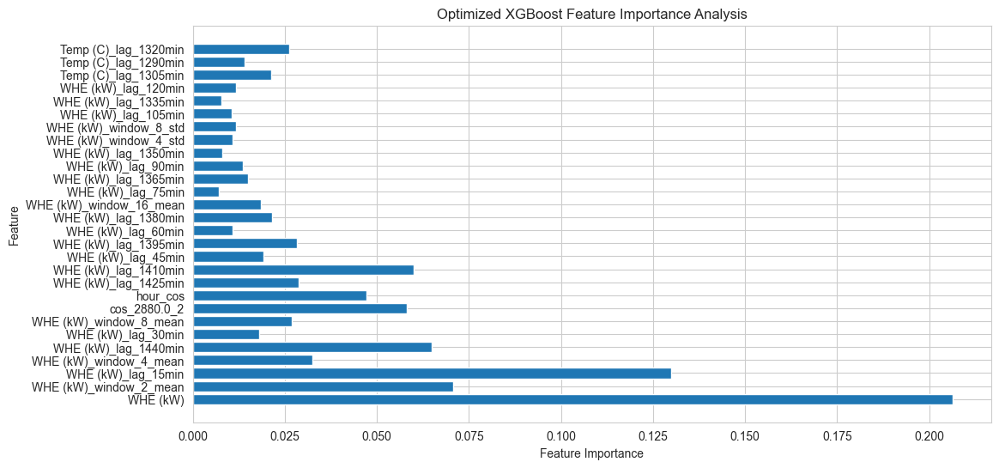

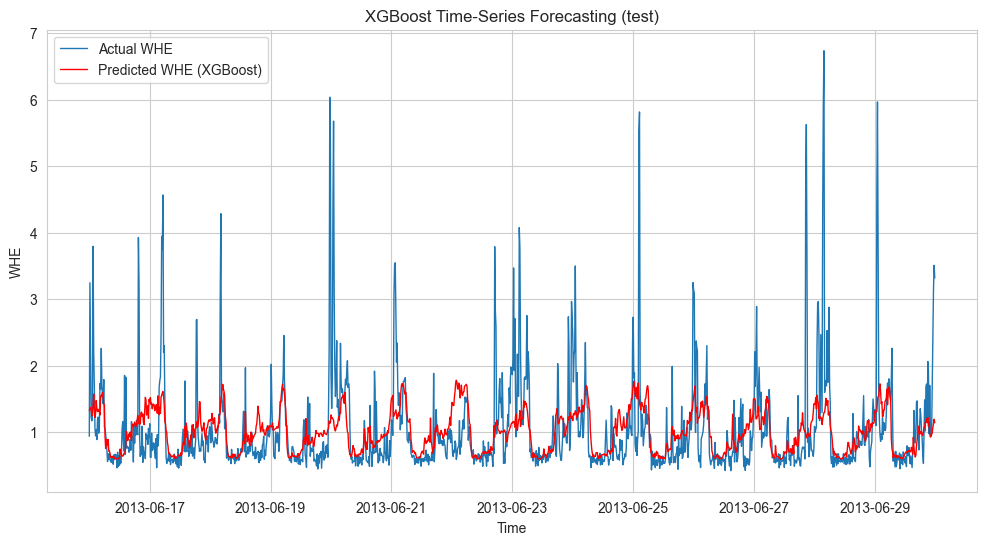

In [ ]:
modelname= 'XGBoost'

# Paths for saved best parameters (TRAINING OUTPUT PATH)
training_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\XGBoost_03.03_n=100"  # Ensure this is the correct training output directory
best_params_path = os.path.join(training_output_dir, f"{modelname}_best_params.json")

# Paths for saving test results (TEST OUTPUT PATH)
test_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TEST\XGBoost_14.03_Test_Results"
os.makedirs(test_output_dir, exist_ok=True)  # Create test output directory

# Load the best hyperparameters from JSON file
with open(best_params_path, "r") as f:
    best_params = json.load(f)

print(f"Loaded Best Parameters from {best_params_path}: {best_params}")

# Define TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

X_train, y_train = DF_training.drop(columns=['y']), DF_training['y']
X_validation, y_validation = DF_validation.drop(columns=['y']), DF_validation['y']
X_test, y_test = DF_test.drop(columns=['y']), DF_test['y']
X_train_validation, y_train_validation = pd.concat([X_train, X_validation], ignore_index=True) , pd.concat([y_train, y_validation], ignore_index=True)

# Ensure features are numeric before training
X_train = X_train.select_dtypes(include=[np.number])
X_validation = X_validation.select_dtypes(include=[np.number])
X_test = X_test.select_dtypes(include=[np.number])
X_train_validation = X_train_validation.select_dtypes(include=[np.number])

# Train the best model using the optimal parameters
best_xgb_model = xgb.XGBRegressor(**best_params, random_state=42, n_jobs=-1)
best_xgb_model.fit(X_train_validation, y_train_validation)

# Predict on validation set
y_pred_test = best_xgb_model.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred_test)
print(f"Mean Squared Error (test): {mse_test:.4f}")
y_pred_test_series = pd.Series(y_pred_test, index=y_test.index, name="Predicted")

# Save final predictions
y_pred_test_path = os.path.join(test_output_dir, f"{modelname}_final_predictions.csv")
y_pred_test_series.to_csv(y_pred_test_path)
print(f"Final predictions saved to {y_pred_test_path}")

# Feature Importance Analysis
feature_importances = best_xgb_model.feature_importances_
plt.figure(figsize=(12, 6))
plt.barh(X_train.columns, feature_importances, align='center')
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Optimized XGBoost Feature Importance Analysis")
plt.show()

# Plot Actual vs. Predicted Values
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual WHE", linewidth=1)
plt.plot(y_test.index, y_pred_test, label="Predicted WHE (XGBoost)", color='red', linewidth=1)
plt.legend()
plt.xlabel("Time")
plt.ylabel("WHE")
plt.title("XGBoost Time-Series Forecasting (test)")
plt.show()


## RandomForest

In [ ]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

Loaded Best Parameters from C:\Users\gkeep\Desktop\Results\DNN\RandomForest_05.03_n=100\RandomForest_best_params.json: {'max_depth': 10, 'n_estimators': 800, 'min_samples_split': 3, 'min_samples_leaf': 4, 'bootstrap': True}
Mean Squared Error (test): 0.4287
Final predictions saved to C:\Users\gkeep\Desktop\Results\DNN\TEST\RandomForest_14.03_Test_Results\RandomForest_final_predictions.csv


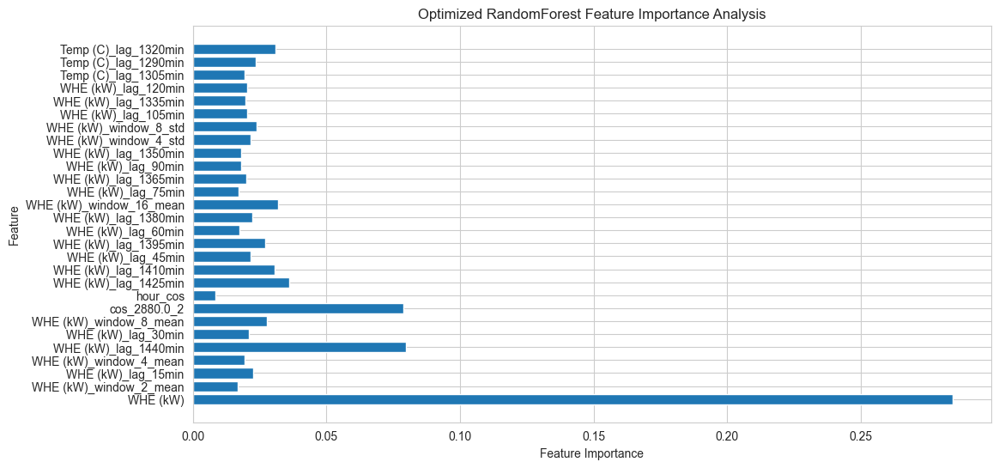

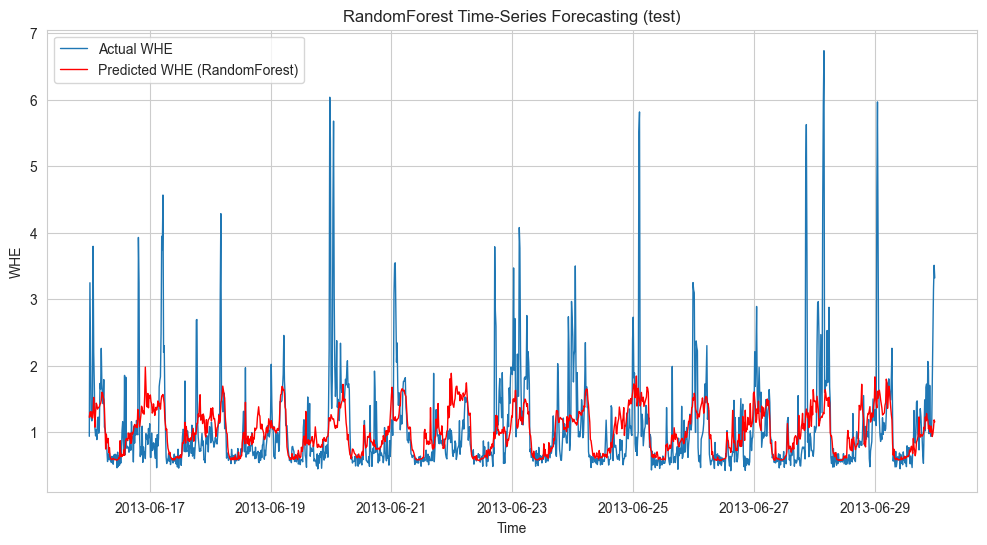

In [ ]:
modelname= 'RandomForest'

# Paths for saved best parameters (TRAINING OUTPUT PATH)
training_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\RandomForest_05.03_n=100"  # Ensure this is the correct training output directory
best_params_path = os.path.join(training_output_dir, f"{modelname}_best_params.json")

# Paths for saving test results (TEST OUTPUT PATH)
test_output_dir = r"C:\Users\gkeep\Desktop\Results\DNN\TEST\RandomForest_14.03_Test_Results"
os.makedirs(test_output_dir, exist_ok=True)  # Create test output directory

# Load the best hyperparameters from JSON file
with open(best_params_path, "r") as f:
    best_params = json.load(f)

print(f"Loaded Best Parameters from {best_params_path}: {best_params}")

# Define TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

X_train, y_train = DF_training.drop(columns=['y']), DF_training['y']
X_validation, y_validation = DF_validation.drop(columns=['y']), DF_validation['y']
X_test, y_test = DF_test.drop(columns=['y']), DF_test['y']
X_train_validation, y_train_validation = pd.concat([X_train, X_validation], ignore_index=True) , pd.concat([y_train, y_validation], ignore_index=True)

# Ensure features are numeric before training
X_train = X_train.select_dtypes(include=[np.number])
X_validation = X_validation.select_dtypes(include=[np.number])
X_test = X_test.select_dtypes(include=[np.number])
X_train_validation = X_train_validation.select_dtypes(include=[np.number])

# Train the best model using the optimal parameters
best_rf_model = RandomForestRegressor(**best_params, random_state=42, n_jobs=-1)
best_rf_model.fit(X_train_validation, y_train_validation)

# Predict on validation set
y_pred_test = best_rf_model.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred_test)
print(f"Mean Squared Error (test): {mse_test:.4f}")
y_pred_test_series = pd.Series(y_pred_test, index=y_test.index, name="Predicted")

# Save final predictions
y_pred_test_path = os.path.join(test_output_dir, f"{modelname}_final_predictions.csv")
y_pred_test_series.to_csv(y_pred_test_path)
print(f"Final predictions saved to {y_pred_test_path}")

# Feature Importance Analysis
feature_importances = best_rf_model.feature_importances_
plt.figure(figsize=(12, 6))
plt.barh(X_train.columns, feature_importances, align='center')
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Optimized RandomForest Feature Importance Analysis")
plt.show()

# Plot Actual vs. Predicted Values
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual WHE", linewidth=1)
plt.plot(y_test.index, y_pred_test, label="Predicted WHE (RandomForest)", color='red', linewidth=1)
plt.legend()
plt.xlabel("Time")
plt.ylabel("WHE")
plt.title("RandomForest Time-Series Forecasting (test)")
plt.show()




# Naive Model

In [20]:
# Naive Model
modelname= "Naive_model"

# Load the DF:-
file = r"C:\Users\gkeep\OneDrive\Desktop\Thesis_coding\Building_Load_15min_Kw.csv"  # Replace with your file name
df = pd.read_csv(file,index_col=0, parse_dates=[0])
df=df[df.index.year.isin([2013])]
df=df[df.index.month.isin([1,2,3,4,5,6])]
df = df.drop(columns=["Temp (C)", "Dew Point Temp (C)", "Rel Hum (%)", "Wind Dir (10s deg)" , "Stn Press (kPa)" , "Wind Spd (km/h)" , "Visibility (km)"])
df["Prediction"] = df["WHE (kW)"].shift(96)
df.dropna(inplace=True)
#df=df.tail(1344)
total_size = len(df)
validation_test_size = 96*7*2

DF_training = df.iloc[:total_size - 2 * validation_test_size]
DF_validation = df.iloc[total_size - 2 * validation_test_size:total_size - validation_test_size]
DF_test = df.iloc[total_size - validation_test_size:]

DF_training_and_DF_validation=pd.concat([DF_training,DF_validation])

# Step 4: Verify the sizes of each set
print("Training set size:", len(DF_training))
print("Validation set size:", len(DF_validation))
print("Test set size:", len(DF_test))


Training set size: 14592
Validation set size: 1344
Test set size: 1344


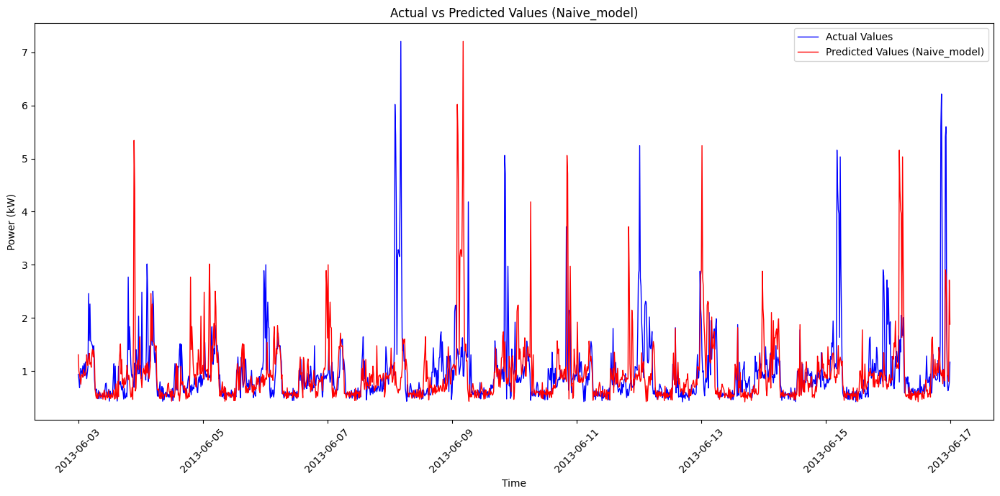

In [21]:
ErrorCalculator(modelname, DF_validation["WHE (kW)"],DF_validation["Prediction"])
plot_predictions(modelname, DF_validation["WHE (kW)"],DF_validation["Prediction"])